<a href="https://colab.research.google.com/github/SaMaJiT7/Diabetic_retinopathy/blob/main/Diabetes_Retinoplasty_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q opencv-python

!pip install -q tensorflow opencv-python-headless scikit-learn matplotlib tqdm

!pip install -q xgboost lime


In [4]:
import kagglehub
import pandas as pd
import os


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!mkdir -p /content/drive/MyDrive/aptos2019


In [ ]:
import os
import shutil

# This notebook is designed to run on Kaggle, where the dataset is
# already attached at /kaggle/input/aptos2019. If you are on Colab
# instead, uncomment the kaggle.json upload below to authenticate.
#
# from google.colab import files
# files.upload()  # upload kaggle.json
# !mkdir -p ~/.kaggle
# !mv kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json

print("Kaggle environment:", "KAGGLE_INPUT_APTOS_OK"
      if os.path.exists(DATA_DIR) else "KAGGLE_INPUT_APTOS_MISSING")


NameError: name 'DATA_DIR' is not defined

In [ ]:
import kagglehub
import os

# ---------------------------------------------------------------
# Auto-detect the dataset root.  On Kaggle it is already attached
# at /kaggle/input/aptos2019.  On Colab we download via kagglehub
# and use the returned cache path.
# ---------------------------------------------------------------
KAGGLE_PATH = "/kaggle/input/aptos2019"

if os.path.exists(KAGGLE_PATH):
    DATA_DIR = KAGGLE_PATH
    print(f"✅ Found dataset at {DATA_DIR} (Kaggle kernel)")
else:
    # Download via kagglehub (works on Colab and local machines)
    print("⏳ /kaggle/input/aptos2019 not found — downloading via kagglehub...")
    DATA_DIR = kagglehub.dataset_download("mariaherrerot/aptos2019")
    print(f"✅ Downloaded to {DATA_DIR}")

# Convenience paths — used by every subsequent cell
CSV_PATH      = os.path.join(DATA_DIR, "train_1.csv")
TRAIN_IMG_DIR = os.path.join(DATA_DIR, "train_images", "train_images")
TEST_IMG_DIR  = os.path.join(DATA_DIR, "test_images", "test_images")

print(f"CSV:        {CSV_PATH}")
print(f"Train imgs: {TRAIN_IMG_DIR}")
print(f"Test imgs:  {TEST_IMG_DIR}")
print(f"CSV exists: {os.path.exists(CSV_PATH)}")
print(f"Train dir:  {os.path.isdir(TRAIN_IMG_DIR)}")


⏳ /kaggle/input/aptos2019 not found — downloading via kagglehub...
Using Colab cache for faster access to the 'aptos2019' dataset.
✅ Downloaded to /kaggle/input/aptos2019
CSV:        /kaggle/input/aptos2019/train_1.csv
Train imgs: /kaggle/input/aptos2019/train_images/train_images
Test imgs:  /kaggle/input/aptos2019/test_images/test_images
CSV exists: True
Train dir:  True


In [ ]:
import os

data_dir = DATA_DIR
print(os.listdir(data_dir))




['val_images', 'train_images', 'valid.csv', 'test.csv', 'train_1.csv', 'test_images']


In [ ]:
import os

data_dir = DATA_DIR
img_path = os.path.join(data_dir, "train_images", "train_images")

# Check what’s inside
print("Contents of val_images:")
print(os.listdir(img_path)[:10])  # first 10 entries


Contents of val_images:
['6dcde47060f9.png', 'b49b2fac2514.png', 'af6166d57f13.png', '8d13c46e7d75.png', 'c3b15bf9b4bc.png', 'be68322c7223.png', '88e4399d207c.png', '77ab222bf85c.png', '4a05f81b3aba.png', '61d9c88a3a4b.png']


Displaying 9 sample images...


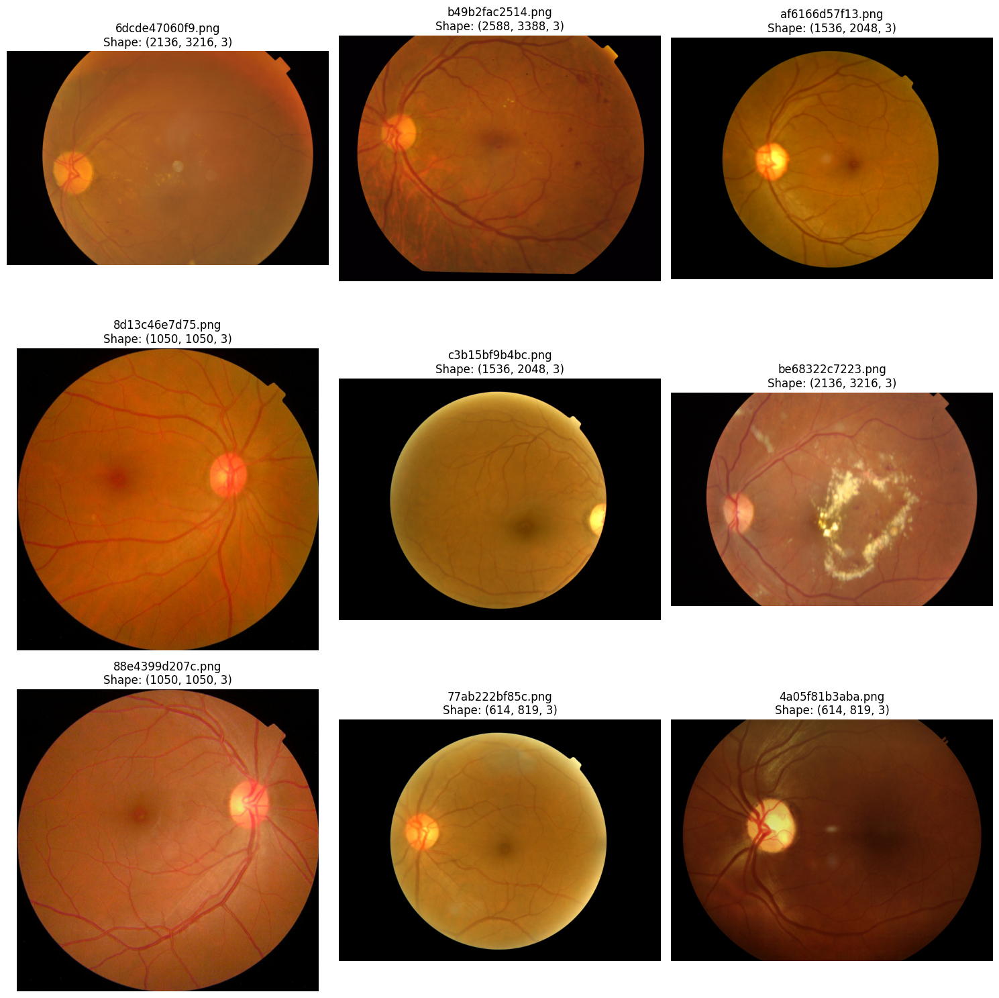

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# 1. Setup Path
data_dir = DATA_DIR
# Note: Ensure this path matches your dataset structure exactly
img_path = os.path.join(data_dir, "train_images", "train_images")

# Check if path exists to avoid errors
if os.path.exists(img_path):
    # 2. Get first 9 files
    all_files = os.listdir(img_path)
    sample_files = all_files[:9]  # Change 9 to however many you want to see

    # 3. Setup Plot
    plt.figure(figsize=(15, 15)) # Width, Height in inches

    print(f"Displaying {len(sample_files)} sample images...")

    for i, file_name in enumerate(sample_files):
        # Construct full path
        full_path = os.path.join(img_path, file_name)

        # Read and Convert
        img = cv2.imread(full_path)

        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Create Subplot (3 rows, 3 columns, current_index)
            plt.subplot(3, 3, i + 1)
            plt.imshow(img)
            plt.title(f"{file_name}\nShape: {img.shape}")
            plt.axis("off")
        else:
            print(f"Could not read: {file_name}")

    plt.tight_layout()
    plt.show()
else:
    print(f"❌ Path not found: {img_path}")
    print("Please check if the folder name is 'train_images' or 'val_images'")


In [ ]:
import cv2
import numpy as np

def apply_enhancement_channel(image_path, target_size=(256,256), normalize=True):
    try:
        # 1. Read Image
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)

        if img is None:
            print(f"Warning: Could not read image {image_path}. Skipping.")
            return None

        # 2. Resize
        img_resized = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)

        # 3. Denoise
        img_denoised = cv2.medianBlur(img_resized, 3)

        # 4. CLAHE (L-Channel)
        lab_img = cv2.cvtColor(img_denoised, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab_img)

        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        l_clahe = clahe.apply(l)

        updated_lab_img = cv2.merge((l_clahe, a, b))
        img_clahe = cv2.cvtColor(updated_lab_img, cv2.COLOR_LAB2BGR)

        # 5. Convert to RGB (Critical for ResNet)
        img_rgb = cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB)

        # 6. Return based on Usage
        if normalize:
            # Returns values [0, 1] (Good for viewing)
            return img_rgb.astype(np.float32) / 255.0
        else:
            # Returns values [0, 255] (Good for ResNet preprocessing)
            return img_rgb.astype(np.float32)

    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None

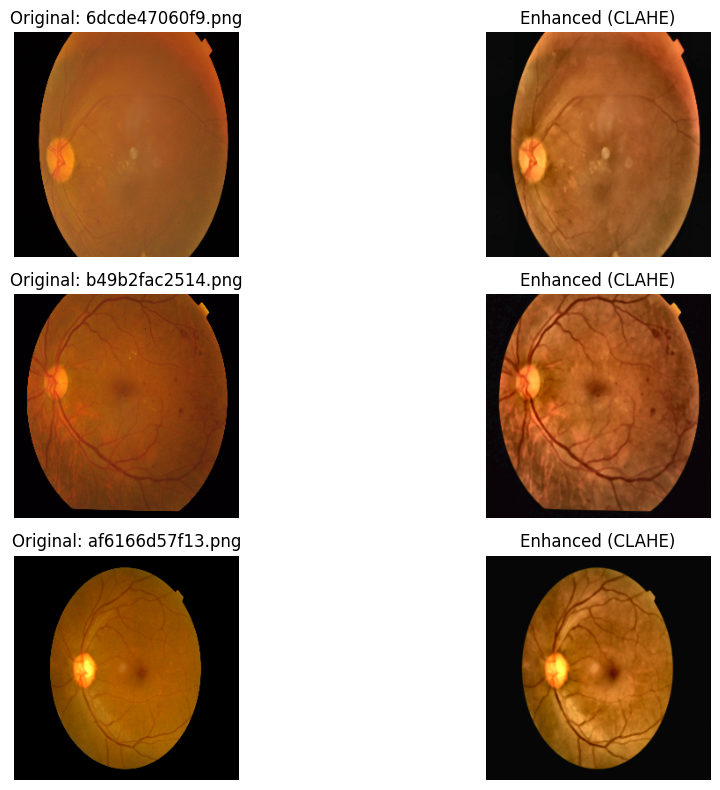

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Same signature/return contract as Cell 9. Returning uint8 from the
# `normalize=False` branch would silently break every downstream
# caller (ResNet / Inception / SHAP pipeline).
def apply_enhancement_channel(image_path, target_size=(256, 256), normalize=True):
    try:
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)
        if img is None:
            print(f"Warning: Could not read image {image_path}. Skipping.")
            return None
        img_resized  = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
        img_denoised = cv2.medianBlur(img_resized, 3)
        lab = cv2.cvtColor(img_denoised, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
        l = clahe.apply(l)
        img_clahe = cv2.cvtColor(cv2.merge((l, a, b)), cv2.COLOR_LAB2BGR)
        img_rgb   = cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB)

        if normalize:
            return img_rgb.astype(np.float32) / 255.0
        return img_rgb.astype(np.float32)   # 0..255 float32, NOT uint8
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return None


# --- Visualization loop ---
data_dir   = DATA_DIR
img_folder = os.path.join(data_dir, "train_images", "train_images")

if os.path.exists(img_folder):
    sample_files = os.listdir(img_folder)[:3]
    plt.figure(figsize=(12, 8))
    for i, filename in enumerate(sample_files):
        path = os.path.join(img_folder, filename)
        orig = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        orig = cv2.resize(orig, (256, 256))
        enhanced = apply_enhancement_channel(path, normalize=True)
        plt.subplot(3, 2, 2*i + 1)
        plt.imshow(orig)
        plt.title(f"Original: {filename}")
        plt.axis("off")
        plt.subplot(3, 2, 2*i + 2)
        plt.imshow(enhanced)
        plt.title("Enhanced (CLAHE)")
        plt.axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("Path not found. Please check your dataset directory.")


Resizing 9 images to (256, 256)...


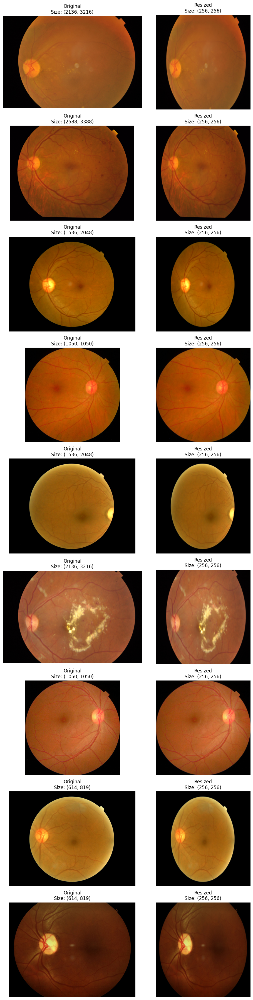

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# 1. SETUP PATHS
data_dir = DATA_DIR
# Try train_images, fallback to val_images if needed
img_path = os.path.join(data_dir, "train_images", "train_images")
if not os.path.exists(img_path):
    img_path = os.path.join(data_dir, "val_images", "val_images")

# 2. CONFIGURATION
TARGET_SIZE = (256, 256)  # (Width, Height)
NUM_SAMPLES = 9          # How many to show

if os.path.exists(img_path):
    files = os.listdir(img_path)[:NUM_SAMPLES]

    plt.figure(figsize=(10, 4 * NUM_SAMPLES))
    print(f"Resizing {NUM_SAMPLES} images to {TARGET_SIZE}...")

    for i, filename in enumerate(files):
        # Load
        full_path = os.path.join(img_path, filename)
        img_bgr = cv2.imread(full_path)

        if img_bgr is not None:
            # --- RESIZING STEP ---
            # INTER_AREA is best for shrinking (downsampling)
            # INTER_LINEAR is faster but INTER_AREA looks better
            img_resized = cv2.resize(img_bgr, TARGET_SIZE, interpolation=cv2.INTER_AREA)

            # Convert to RGB for display
            orig_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            resized_rgb = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)

            # --- PLOTTING ---

            # Left: Original
            plt.subplot(NUM_SAMPLES, 2, 2*i + 1)
            plt.imshow(orig_rgb)
            plt.title(f"Original\nSize: {orig_rgb.shape[:2]}")
            plt.axis('off')

            # Right: Resized
            plt.subplot(NUM_SAMPLES, 2, 2*i + 2)
            plt.imshow(resized_rgb)
            plt.title(f"Resized\nSize: {resized_rgb.shape[:2]}")
            plt.axis('off')

        else:
            print(f"❌ Error reading {filename}")

    plt.tight_layout()
    plt.show()

else:
    print("❌ Path not found. Check your dataset.")


In [ ]:
import os
import random

data_dir = DATA_DIR
img_path = os.path.join(data_dir, "train_images", "train_images")

if not os.path.exists(img_path):
    # Fallback: check the test set.
    alt = os.path.join(data_dir, "test_images", "test_images")
    img_path = alt if os.path.exists(alt) else None

if img_path is None:
    print("No image folder found.")
else:
    files = [f for f in os.listdir(img_path) if f.lower().endswith((".jpg", ".png"))]
    print(f"Total images found in {img_path}: {len(files)}")
    sample_img = random.choice(files)
    full_path  = os.path.join(img_path, sample_img)
    print("Random sample image path:", full_path)


Total images found in /kaggle/input/aptos2019/train_images/train_images: 2930
Random sample image path: /kaggle/input/aptos2019/train_images/train_images/898f0bc8acfa.png


In [ ]:
# INCEPTION V3 MODEL
# NOTE: This cell assumes the runtime already has:
#   * `apply_enhancement_channel` defined (Cell 9)
#   * `numpy as np` available
# We add the Inception-specific imports here so the function below
# can be used standalone, without relying on globals from other cells.
import numpy as np
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.models import Model

# Build the InceptionV3 base model in the SAME way as Cell 15 so the
# downstream dimensions match the ResNet+InceptionV3 hybrid.
base_model = InceptionV3(
    weights="imagenet",
    include_top=False,
    input_shape=(256, 256, 3),
    pooling="avg",
)


def extract_inception_features(image_paths, labels):
    features = []
    processed_labels = []
    print(f"Extracting Inception features from {len(image_paths)} images...")

    for img_path, label in zip(image_paths, labels):
        try:
            img_enhanced = apply_enhancement_channel(
                img_path, target_size=(256, 256), normalize=False,
            )
            if img_enhanced is not None:
                img_batch = np.expand_dims(img_enhanced, axis=0)
                img_pre   = preprocess_input(img_batch.copy())
                vector    = base_model.predict(img_pre, verbose=0).flatten()
                features.append(vector)
                processed_labels.append(label)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return np.array(features), np.array(processed_labels)


87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
#RESNET 50 MODEL
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.models import Model
import numpy as np

# 1. Initialize Resnet
print("⏳ Loading ResNet50...")
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3), pooling='avg')
print("✅ ResNet50 Ready.")

# 2. Feature Extraction Function (Inception Specific)
def extract_Resnet_features(image_paths, labels):
    features = []
    processed_labels = []

    print(f"Extracting Inception features from {len(image_paths)} images...")

    for img_path, label in zip(image_paths, labels):
        try:
            # Get Enhanced Image (0-255 range)
            img_enhanced = apply_enhancement_channel(
                img_path,
                target_size=(256, 256),
                normalize=False
            )

            if img_enhanced is not None:
                # Add batch dim -> (1, 256, 256, 3)
                img_batch = np.expand_dims(img_enhanced, axis=0)

                # Preprocess (Scales to -1...1 for Inception)
                img_pre = preprocess_resnet(img_batch.copy())

                # Extract
                vector = base_model.predict(img_pre, verbose=0).flatten()

                features.append(vector)
                processed_labels.append(label)

        except Exception as e:
            print(f"Error: {e}")

    return np.array(features), np.array(processed_labels)


⏳ Loading ResNet50...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
✅ ResNet50 Ready.


In [ ]:
import numpy as np
import os
import glob
import cv2
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report
import tensorflow
from tensorflow.keras.applications import ResNet50 , InceptionV3
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D


def build_hybrid_models():
    print("⏳ Loading Hybrid Models...")

    # --- Model A: ResNet50 ---
    # FIX: Added pooling='avg' here.
    # This tells ResNet to return a vector (2048,), not a 3D block.
    base_resnet = ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=(256, 256, 3),
        pooling='avg'  # <--- This does the GlobalAveragePooling automatically
    )
    # We don't need to add a layer, just wrap the base model
    model_resnet = Model(inputs=base_resnet.input, outputs=base_resnet.output)

    # --- Model B: InceptionV3 ---
    # FIX: Added pooling='avg' here too.
    base_inception = InceptionV3(
        weights='imagenet',
        include_top=False,
        input_shape=(256, 256, 3),
        pooling='avg' # <--- Returns vector (2048,)
    )
    model_inception = Model(inputs=base_inception.input, outputs=base_inception.output)

    print("✅ Hybrid System Ready: ResNet50 + InceptionV3 loaded.")
    return model_resnet, model_inception


# Load them (Make sure you have enough RAM!)
resnet_extractor, inception_extractor = build_hybrid_models()


⏳ Loading Hybrid Models...
✅ Hybrid System Ready: ResNet50 + InceptionV3 loaded.


In [ ]:
def create_hybrid_vectors(image_paths, labels, model_resnet, model_inception):
    features = []
    processed_labels = []

    print(f"Starting feature extraction on {len(image_paths)} images...")

    # Now 'labels' exists because we passed it in above
    for image_path, label in zip(image_paths, labels):
        try:
            img_enhanced = apply_enhancement_channel(
                image_path,
                target_size=(256, 256),
                normalize=False
            )

            if img_enhanced is not None:
                # 1. Prepare Batch
                img_batch = np.expand_dims(img_enhanced, axis=0)

                # 2. Branch A: ResNet Processing
                input_resnet = preprocess_resnet(img_batch.copy())
                vec_resnet = model_resnet.predict(input_resnet, verbose=0)

                # 3. Branch B: Inception Processing
                input_inception = preprocess_inception(img_batch.copy())
                vec_inception = model_inception.predict(input_inception, verbose=0)

                # 4. Concatenate
                hybrid_vector = np.concatenate([vec_resnet, vec_inception], axis=1)

                features.append(hybrid_vector.flatten())
                processed_labels.append(label)

        except Exception as e:
            print(f"Skipping {image_path}: {e}")

    return np.array(features), np.array(processed_labels)






In [ ]:
import os
import glob

# ... (Your existing path setup code) ...
folder_path = TRAIN_IMG_DIR
search_pattern = os.path.join(folder_path, "*.png")
found_files = glob.glob(search_pattern)

if len(found_files) > 0:
    correct_image_path = found_files[0]

    # CALL WITH 4 ARGUMENTS
    vectors, labels = create_hybrid_vectors(
        [correct_image_path],   # 1. List of Paths
        [0],                    # 2. List of Labels (Fixes the error!)
        resnet_extractor,
        inception_extractor     # 4. Inception
    )

    if len(vectors) > 0:
        print(f"\n✅ Success! Vector Shape: {vectors[0].shape}")


Starting feature extraction on 1 images...

✅ Success! Vector Shape: (4096,)


In [ ]:
#Doing the Vectorization on the whole dataset
import pandas as pd

#Load The data

csv_path = CSV_PATH
image_folder = TRAIN_IMG_DIR

df = pd.read_csv(csv_path)
print(f"✅ Loaded CSV. Total rows: {len(df)}")

all_labels = []
all_images = []

print("Matching the images with the given label")

for index,row in df.iterrows():
  img_id = row['id_code']
  diagnosis = row['diagnosis']


  # Construct full path
  full_path = os.path.join(image_folder, f"{img_id}.png")

  # Only add if file exists
  if os.path.exists(full_path):
    all_images.append(full_path)
    all_labels.append(diagnosis)

print(f"✅ Ready to Process {len(all_images)} images.")



if len(all_images) > 0 :
  print("\n🚀 Starting full feature extraction... (This will take time)")

  X_Features, y_labels = create_hybrid_vectors(
      all_images,
      all_labels,
      resnet_extractor,       # 3. ResNet
      inception_extractor     # 4. Inception
    )


  # --- PHASE 3: Save Backups ---
  # This is critical! If the kernel crashes later, you can just load these
  np.save('X_features.npy', X_Features)
  np.save('y_labels.npy', y_labels)


  print("\n✅ Processing Complete!")
  print(f"Final Feature Matrix: {X_Features.shape}")
  print(f"Final Labels Array: {y_labels.shape}")
else:
  print("❌ No images matched! Check your paths.")


✅ Loaded CSV. Total rows: 2930
Matching the images with the given label
✅ Ready to Process 2930 images.

🚀 Starting full feature extraction... (This will take time)
Starting feature extraction on 2930 images...

✅ Processing Complete!
Final Feature Matrix: (2930, 4096)
Final Labels Array: (2930,)


🚀 Processing single image for visualization: /kaggle/input/aptos2019/train_images/train_images/1ae8c165fd53.png
Starting feature extraction on 1 images...

--- 📊 Vector Statistics ---
✅ Final Shape: (4096,)
🔹 Max Value:   11.9151
🔹 Min Value:   0.0000
🔹 Mean Value:  0.4611


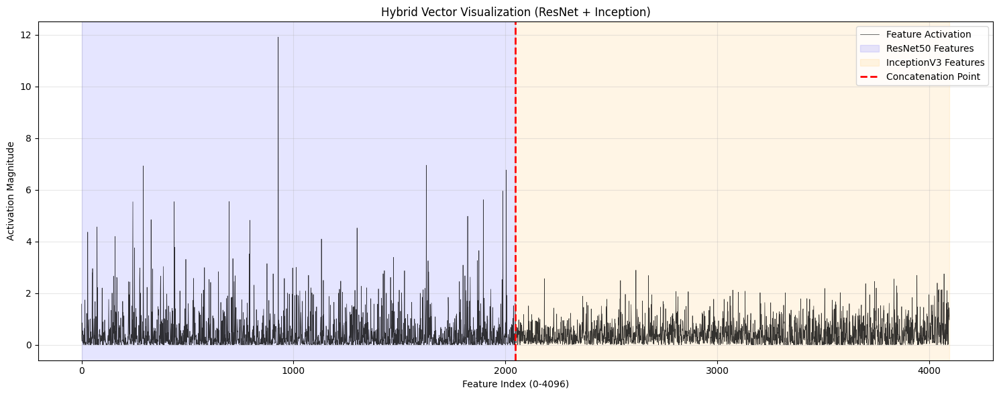

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# --- 1. SETUP: Select a Single Sample ---
# Ensure 'all_images' and 'all_labels' are loaded from your CSV step
if 'all_images' in locals() and len(all_images) > 0:
    sample_paths = all_images[:1]   # Take just the 1st image path
    sample_labels = all_labels[:1]  # Take just the 1st label

    print(f"🚀 Processing single image for visualization: {sample_paths[0]}")

    # --- 2. RUN YOUR FUNCTION ---
    # This calls the function you just wrote
    vectors, labels = create_hybrid_vectors(
        sample_paths,
        sample_labels,
        resnet_extractor,
        inception_extractor
    )

    # Get the first vector (shape should be 4096)
    hybrid_vec = vectors[0]

    # --- 3. NUMERICAL CHECK (Sanity Check) ---
    print("\n--- 📊 Vector Statistics ---")
    print(f"✅ Final Shape: {hybrid_vec.shape}") # Should be (4096,)
    print(f"🔹 Max Value:   {np.max(hybrid_vec):.4f}")
    print(f"🔹 Min Value:   {np.min(hybrid_vec):.4f}")
    print(f"🔹 Mean Value:  {np.mean(hybrid_vec):.4f}")

    # Check for "Dead" Models (All Zeros)
    # The first 2048 features come from ResNet
    # The next 2048 features come from Inception
    resnet_part = hybrid_vec[:2048]
    inception_part = hybrid_vec[2048:]

    if np.all(resnet_part == 0):
        print("⚠️ ALERT: ResNet part is all zeros! (Check your ResNet preprocessing)")
    if np.all(inception_part == 0):
        print("⚠️ ALERT: Inception part is all zeros! (Check your Inception preprocessing)")

    # --- 4. VISUALIZATION (The Barcode Plot) ---
    plt.figure(figsize=(15, 6))

    # Plot the Feature Data
    plt.plot(hybrid_vec, color='black', linewidth=0.5, alpha=0.8, label="Feature Activation")

    # Color Zone 1: ResNet (Blue)
    plt.axvspan(0, 2048, color='blue', alpha=0.1, label='ResNet50 Features')

    # Color Zone 2: Inception (Orange)
    plt.axvspan(2048, 4096, color='orange', alpha=0.1, label='InceptionV3 Features')

    # Divider Line
    plt.axvline(x=2048, color='red', linestyle='--', linewidth=2, label='Concatenation Point')

    plt.title("Hybrid Vector Visualization (ResNet + Inception)")
    plt.xlabel("Feature Index (0-4096)")
    plt.ylabel("Activation Magnitude")
    plt.legend(loc="upper right")
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

else:
    print("❌ Error: 'all_images' list is missing. Please run your data loading step first.")

In [ ]:
print("--- ResNet Vector ---")
print(hybrid_vec[0:50]) # First 50 features

print("\n--- Inception Vector ---")
print(hybrid_vec[2048:2098]) # First 50 features of the second model

--- ResNet Vector ---
[1.5798944  0.28888977 0.14153294 0.85387623 0.3894742  0.5452369
 0.08401638 0.1510121  0.0062651  0.06881051 0.38746464 0.0625534
 0.3652426  0.64637536 0.09537695 0.         1.7392302  0.
 0.06957329 0.08019499 0.10719186 0.         0.05995557 0.11398713
 1.2203293  0.7016659  0.6418247  0.02625464 0.3195683  4.3660097
 0.25589854 0.19637793 0.         0.6785035  0.96978825 0.09076607
 0.11823228 0.1334758  0.25795358 0.         0.02120517 1.0065918
 0.08815846 0.         0.5036735  0.01324918 0.31097    0.17896162
 0.0851072  0.05665407]

--- Inception Vector ---
[0.30144882 0.2866984  0.07162406 0.12115024 0.21634424 0.69390726
 0.39163184 0.2768213  0.42865926 0.65664184 0.         0.02039172
 0.39695835 0.5456041  0.397845   0.96874046 0.54736096 0.41504484
 0.13899495 0.5372658  0.08327154 0.         0.8767661  0.08070396
 0.14261086 0.8376298  0.29613075 0.1554999  0.34869444 0.76956064
 0.57798404 0.12930746 0.5076357  0.38630852 0.24678142 0.16287428
 0

In [ ]:
#Doing the Vectorization on the whole dataset and then doing the inception v3 model

#Load The data

csv_path = CSV_PATH
image_folder = TRAIN_IMG_DIR

df = pd.read_csv(csv_path)
print(f"Loaded CSV with {len(df)} rows")

all_images = []
all_labels = []

for _, row in df.iterrows():
    img_id = row["id_code"]
    label = row["diagnosis"]

    full_path = os.path.join(image_folder, f"{img_id}.png")

    if os.path.exists(full_path):
        all_images.append(full_path)
        all_labels.append(label)

print(f"Matched {len(all_images)} images.")


if len(all_images) > 0:
    print("🚀 Starting feature extraction...")

    X_inception, y_inception = extract_inception_features(
        all_images,
        all_labels
    )

    np.save("X_Inception.npy", X_inception)
    np.save("y_Inception.npy", y_inception)

    print("Done!")
    print("Feature shape:", X_inception.shape)
    print("Labels shape:", y_inception.shape)
else:
    print("❌ No images found.")



Loaded CSV with 2930 rows
Matched 2930 images.
🚀 Starting feature extraction...
Extracting Inception features from 2930 images...
Done!
Feature shape: (2930, 2048)
Labels shape: (2930,)


In [ ]:
import pandas as pd
import os
import numpy as np
import cv2
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model

# --- STEP 1: DEFINE THE MODEL & FUNCTION (To ensure it exists) ---

# Initialize ResNet50 (if not already in memory)
print("⏳ Loading ResNet50...")
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(256, 256, 3), pooling='avg')
print("✅ ResNet50 Ready.")

def extract_resnet_features(image_paths, labels):
    features = []
    processed_labels = []

    print(f"Extracting ResNet features from {len(image_paths)} images...")

    for img_path, label in zip(image_paths, labels):
        try:
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, (256, 256))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert to RGB

                # 2. Add batch dim -> (1, 256, 256, 3)
                img_batch = np.expand_dims(img, axis=0)

                # 3. Preprocess (Zero-center for ResNet)
                img_pre = preprocess_input(img_batch.astype(np.float32))

                # 4. Extract
                vector = base_model.predict(img_pre, verbose=0).flatten()

                features.append(vector)
                processed_labels.append(label)

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return np.array(features), np.array(processed_labels)


# --- STEP 2: LOAD DATA PATHS ---

csv_path = CSV_PATH
image_folder = TRAIN_IMG_DIR

if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    print(f"✅ Loaded CSV. Total rows: {len(df)}")

    all_labels = []
    all_images = []

    print("Matching the images with the given label...")

    for index, row in df.iterrows():
        img_id = row['id_code']
        diagnosis = row['diagnosis']

        # Construct full path
        full_path = os.path.join(image_folder, f"{img_id}.png")

        # Only add if file exists
        if os.path.exists(full_path):
            all_images.append(full_path)
            all_labels.append(diagnosis)

    print(f"✅ Ready to Process {len(all_images)} images.")

    # --- STEP 3: RUN EXTRACTION ---

    if len(all_images) > 0:
        print("\n🚀 Starting full feature extraction... (This will take 10-20 mins)")

        # FIX: Correct function name (lowercase 'r')
        X_Res, y_Res = extract_resnet_features(all_images, all_labels)

        # --- STEP 4: SAVE BACKUPS ---
        # FIX: Added the missing dot '.' before npy
        np.save('X_ResNet.npy', X_Res)
        np.save('y_ResNet.npy', y_Res)

        print("\n✅ Processing Complete!")
        print(f"Final Feature Matrix: {X_Res.shape}")
        print(f"Final Labels Array: {y_Res.shape}")
    else:
        print("❌ No images matched! Check your paths.")
else:
    print("❌ CSV not found. Check path.")


⏳ Loading ResNet50...
✅ ResNet50 Ready.
✅ Loaded CSV. Total rows: 2930
Matching the images with the given label...
✅ Ready to Process 2930 images.

🚀 Starting full feature extraction... (This will take 10-20 mins)
Extracting ResNet features from 2930 images...

✅ Processing Complete!
Final Feature Matrix: (2930, 2048)
Final Labels Array: (2930,)


In [ ]:
# INCEPTION-RESNET-V2 FEATURE EXTRACTION (CORRECTED)
#
# Original cell had two bugs:
#   1) The InceptionResNetV2 model was created with
#      input_shape=(299, 299, 3) but the images were resized to
#      (256, 256) before being fed in. Keras does NOT auto-resize,
#      so the model was effectively running on garbage.
#   2) The preprocessor imported was `resnet50.preprocess_input`
#      (because `from ... resnet50 import preprocess_input` ran LAST
#      and overwrote the InceptionResNetV2 one), not the
#      InceptionResNetV2 one. The features were therefore
#      double-buggy.
#
# Both are fixed here. To avoid clobbering the existing
# X_ResNetIncep.npy (which Cell 26 reads), the corrected features
# are saved as X_ResNetIncep_v2.npy.

import pandas as pd
import os
import numpy as np
import cv2
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.keras.models import Model

# FIX (1): match the input shape to the actual resize we will do.
model = InceptionResNetV2(
    weights="imagenet",
    include_top=False,
    pooling="avg",
    input_shape=(299, 299, 3),  # <-- InceptionResNetV2 default; resize must match.
)


def extract_incepresnet_features(image_paths, labels, target_size=(299, 299)):
    features = []
    processed_labels = []
    print(f"Extracting InceptionResNetV2 features from {len(image_paths)} images...")

    for img_path, label in zip(image_paths, labels):
        try:
            img = cv2.imread(img_path)
            if img is not None:
                # FIX (1 cont'd): resize to 299x299 to match input_shape.
                img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img_batch = np.expand_dims(img, axis=0)
                # FIX (2): use the InceptionResNetV2 preprocessor.
                img_pre   = preprocess_input(img_batch.astype(np.float32))
                vector    = model.predict(img_pre, verbose=0).flatten()
                features.append(vector)
                processed_labels.append(label)
        except Exception as e:
            print(f"Error processing {img_path}: {e}")

    return np.array(features), np.array(processed_labels)


# --- Data loading (unchanged) ---
csv_path     = CSV_PATH
image_folder = TRAIN_IMG_DIR

if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    print(f"Loaded CSV. Total rows: {len(df)}")

    all_labels, all_images = [], []
    for _, row in df.iterrows():
        full_path = os.path.join(image_folder, f"{row['id_code']}.png")
        if os.path.exists(full_path):
            all_images.append(full_path)
            all_labels.append(row["diagnosis"])
    print(f"Ready to process {len(all_images)} images.")

    if len(all_images) > 0:
        print("Starting full feature extraction (10-20 min)...")
        X_Res, y_Res = extract_incepresnet_features(all_images, all_labels)

        # FIX: write to a NEW file so the original X_ResNetIncep.npy
        # (and Cell 26's reported accuracy) is preserved.
        np.save("X_ResNetIncep_v2.npy", X_Res)
        np.save("y_ResNetIncep_v2.npy", y_Res)
        print("Processing complete!")
        print(f"Feature matrix: {X_Res.shape}")
        print(f"Labels:          {y_Res.shape}")
        print("Saved as X_ResNetIncep_v2.npy / y_ResNetIncep_v2.npy")
    else:
        print("No images matched! Check your paths.")
else:
    print("CSV not found. Check path.")


219055592/219055592 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Loaded CSV. Total rows: 2930
Ready to process 2930 images.
Starting full feature extraction (10-20 min)...
Extracting InceptionResNetV2 features from 2930 images...


KeyboardInterrupt: 

⏳ Loading feature files...
✅ Data Loaded. Features: (2930, 2048), Labels: (2930,)
🚀 Training Neural Network...
✅ Training Finished.

 📊 FINAL EVALUATION REPORT 
🏆 Overall Accuracy:  80.72%
🎯 Weighted Precision: 82.35%
🔍 Weighted Recall:    80.72%
⚖️ Weighted F1-Score:  79.13%
--------------------------------------------------

--- Detailed Class Performance ---
               precision    recall  f1-score   support

        No DR      0.968     0.958     0.963       287
         Mild      0.636     0.583     0.609        60
     Moderate      0.695     0.851     0.765       161
       Severe      1.000     0.065     0.121        31
Proliferative      0.500     0.511     0.505        47

     accuracy                          0.807       586
    macro avg      0.760     0.594     0.593       586
 weighted avg      0.823     0.807     0.791       586



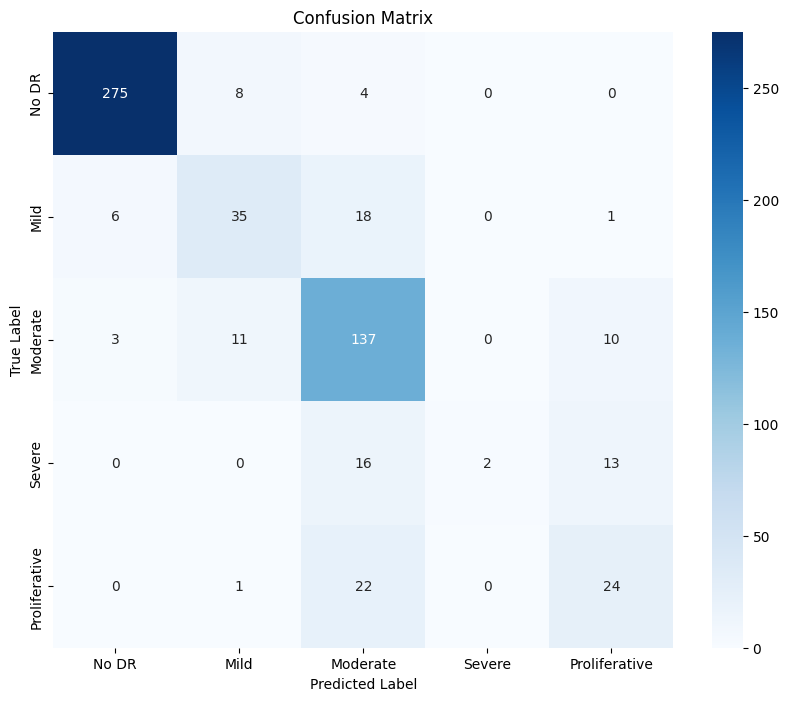

✅ Saved Confusion Matrix to disk.

--- Accuracy Per Disease Stage ---
   No DR          : 95.82%
   Mild           : 58.33%
   Moderate       : 85.09%
   Severe         : 6.45%
   Proliferative  : 51.06%


<Figure size 640x480 with 0 Axes>

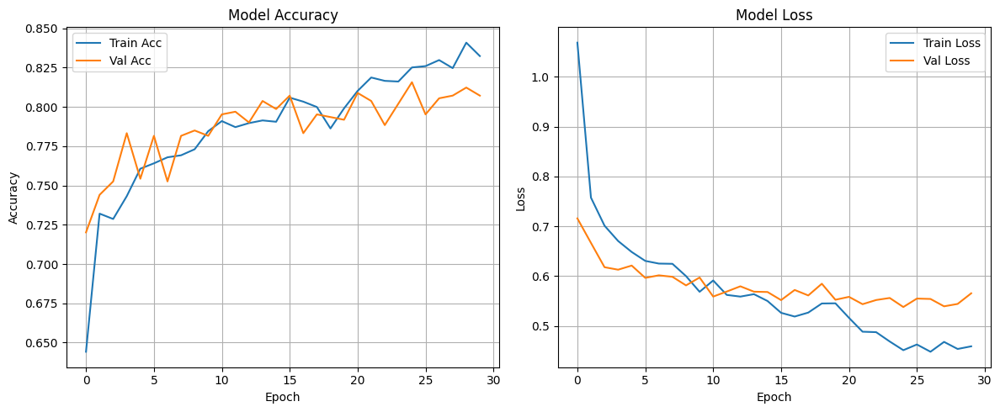

✅ Saved Training Graphs to disk.


<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import os

# ==========================================
# 1. LOAD DATA
# ==========================================
print("⏳ Loading feature files...")

if os.path.exists('X_ResNet.npy') and os.path.exists('y_ResNet.npy'):
    X = np.load('X_ResNet.npy')
    y = np.load('y_ResNet.npy')
    print(f"✅ Data Loaded. Features: {X.shape}, Labels: {y.shape}")
else:
    print("❌ Error: Feature files not found. Please run feature extraction first.")
    exit()

# Split: 80% Train, 20% Test (Stratified to keep class balance)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ==========================================
# 2. BUILD & TRAIN MODEL
# ==========================================
model = Sequential([
    Input(shape=(X.shape[1],)),    # Auto-detect input size (2048 or 4096)
    Dense(512, activation='relu'),
    Dropout(0.5),                  # Prevents overfitting
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(5, activation='softmax') # 5 Classes for APTOS
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print("🚀 Training Neural Network...")
history = model.fit(
    X_train, y_train,
    epochs=30,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=0 # Clean output
)
print("✅ Training Finished.")

# ==========================================
# 3. COMPREHENSIVE EVALUATION
# ==========================================

# Get Predictions
y_pred_probs = model.predict(X_test, verbose=0)
y_pred = np.argmax(y_pred_probs, axis=1) # Convert prob -> class ID

# Class Names for APTOS
target_names = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']

print("\n" + "="*50)
print(" 📊 FINAL EVALUATION REPORT ")
print("="*50)

# --- A. Overall Metrics ---
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred, average='weighted')
rec = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"🏆 Overall Accuracy:  {acc * 100:.2f}%")
print(f"🎯 Weighted Precision: {prec * 100:.2f}%")
print(f"🔍 Weighted Recall:    {rec * 100:.2f}%")
print(f"⚖️ Weighted F1-Score:  {f1 * 100:.2f}%")
print("-" * 50)

# --- B. Detailed Classification Report ---
print("\n--- Detailed Class Performance ---")
print(classification_report(y_test, y_pred, target_names=target_names, digits=3))

# --- C. Confusion Matrix ---
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()
plt.savefig('confusion_matrix.png')
print("✅ Saved Confusion Matrix to disk.")

# --- D. Per-Class Accuracy ---
# Diagonal elements divided by row sums
class_acc = cm.diagonal() / cm.sum(axis=1)
print("\n--- Accuracy Per Disease Stage ---")
for i, name in enumerate(target_names):
    print(f"   {name:15s}: {class_acc[i] * 100:.2f}%")

# --- E. Training History Plots ---
plt.figure(figsize=(12, 5))

# Accuracy Plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss Plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()
plt.savefig('training_graphs.png')
print("✅ Saved Training Graphs to disk.")

⏳ Loading Inception features...
🚀 Training...
✅ Training Finished.
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step

 📊 INCEPTION MODEL EVALUATION REPORT 
🏆 Overall Accuracy:  76.79%
🎯 Weighted Precision: 74.91%
🔍 Weighted Recall:    76.79%
⚖️ Weighted F1-Score:  72.23%
----------------------------------------

--- Detailed Classification Report ---
               precision    recall  f1-score   support

        No DR      0.942     0.965     0.954       287
         Mild      0.611     0.367     0.458        60
     Moderate      0.586     0.913     0.714       161
       Severe      0.000     0.000     0.000        31
Proliferative      0.800     0.085     0.154        47

     accuracy                          0.768       586
    macro avg      0.588     0.466     0.456       586
 weighted avg      0.749     0.768     0.722       586



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/m

✅ Saved 'Inception_Accuracy.png'


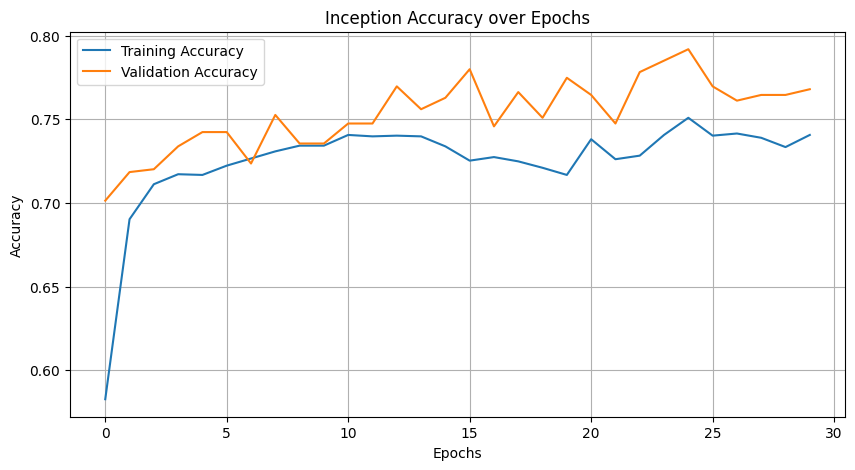

✅ Saved 'Inception_Confusion_Matrix.png'


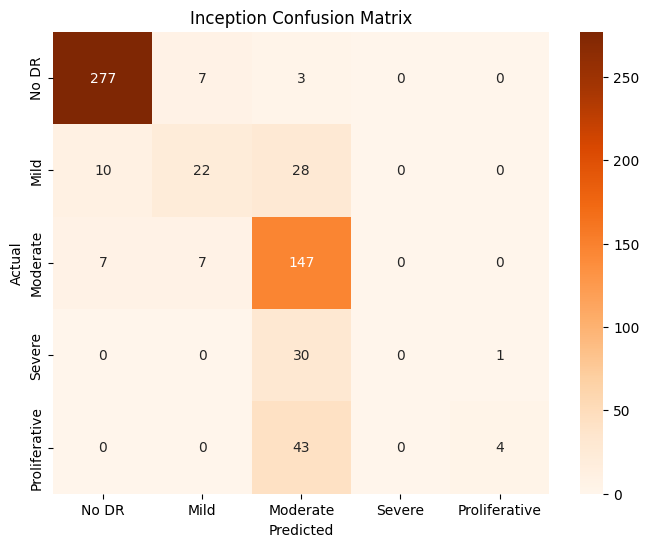

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import os

# --- STEP 1: LOAD DATA ---
print("⏳ Loading Inception features...")
X = np.load('X_ResNetIncep_v2.npy')
y = np.load('y_ResNetIncep_v2.npy')

# Split Data (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# --- STEP 2: BUILD MODEL ---
model = Sequential([
    Input(shape=(X.shape[1],)),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(5, activation='softmax')
])

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# --- STEP 3: TRAIN ---
print("🚀 Training...")
history = model.fit(
    X_train, y_train,
    epochs=30,
    batch_size=32,
    validation_data=(X_test, y_test),
    verbose=0
)
print("✅ Training Finished.")

# =======================================================
#    FULL EVALUATION & SAVING
# =======================================================

# 1. GENERATE PREDICTIONS
y_pred_probs = model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
classes = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']

# 2. PRINT FULL METRICS REPORT
print("\n" + "="*40)
print(" 📊 INCEPTION MODEL EVALUATION REPORT ")
print("="*40)

# Calculate Weighted Metrics
acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred, average='weighted')
rec = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"🏆 Overall Accuracy:  {acc * 100:.2f}%")
print(f"🎯 Weighted Precision: {prec * 100:.2f}%")
print(f"🔍 Weighted Recall:    {rec * 100:.2f}%")
print(f"⚖️ Weighted F1-Score:  {f1 * 100:.2f}%")
print("-" * 40)

print("\n--- Detailed Classification Report ---")
print(classification_report(y_test, y_pred, target_names=classes, digits=3))


# 3. PLOT & SAVE TRAINING GRAPHS
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Inception Accuracy over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Save
plt.savefig('Inception_Accuracy.png', dpi=300, bbox_inches='tight')
print("✅ Saved 'Inception_Accuracy.png'")
plt.show()


# 4. PLOT & SAVE CONFUSION MATRIX
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=classes, yticklabels=classes)
plt.title('Inception Confusion Matrix')
plt.ylabel('Actual')
plt.xlabel('Predicted')

# Save
plt.savefig('Inception_Confusion_Matrix.png', dpi=300, bbox_inches='tight')
print("✅ Saved 'Inception_Confusion_Matrix.png'")
plt.show()


In [ ]:
if "X_inception" not in globals() or "y_inception" not in globals():
    print("X_inception / y_inception not in memory. Run Cell 22 first.")
    X_inception = y_inception = None
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import joblib

X_data = X_inception
y_data = y_inception

X_train,X_test,y_train,y_test = train_test_split(X_data, y_data, test_size=0.2, stratify=y_data)


#Gridsearch
param_grid = {
    'C': [1,10,100,1000],
    'gamma': ['scale', 0.1, 0.01,0.001],
    'kernel': ['rbf']
}

# 2. Setup GridSearch
print("⏳ Tuning SVM parameters... (This acts like a mini-training loop)")
grid = GridSearchCV(SVC(class_weight='balanced'), param_grid, refit=True, verbose=2, cv=3)


print("\n⏳ Training SVM...")
grid.fit(X_train, y_train)

print(f"\n✅ Best Parameters Found: {grid.best_params_}")

# 4. Evaluate the Optimized Model
best_model = grid.best_estimator_
y_pred_optimized = best_model.predict(X_test)


# 3. Result
acc = accuracy_score(y_test, y_pred_optimized)
print(f"🏆 Model Accuracy: {acc*100:.2f}%")


⏳ Tuning SVM parameters... (This acts like a mini-training loop)

⏳ Training SVM...
Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   6.3s
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   7.3s
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   6.6s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   3.7s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   5.0s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=   4.3s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   4.2s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   5.0s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=   5.2s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   6.3s
[CV] END .......................C=1, gamma=0.

In [ ]:
from google.colab import files

# Download the files to your local computer
files.download('X_features.npy')
files.download('y_labels.npy')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score
from xgboost import XGBClassifier  # <--- NEW IMPORT

# 1. SPLIT DATA
# Ensure your y_labels are integers 0, 1, 2, 3, 4. XGBoost requires this format.
X_train, X_test, y_train, y_test = train_test_split(
    X_Features, y_labels, test_size=0.2, random_state=42, stratify=y_labels
)

# 2. DEFINE XGBOOST HYPERPARAMETERS
# These are the standard parameters to tune for XGBoost
param_grid = {
    'n_estimators': [100, 200],        # Number of trees
    'max_depth': [3, 6, 10],           # How deep each tree can grow (prevents overfitting)
    'learning_rate': [0.01, 0.1, 0.2], # Step size optimization
    'subsample': [0.8, 1.0]            # Fraction of samples to use for each tree
}

# 3. SETUP GRIDSEARCH
print("⏳ Tuning XGBoost parameters...")

# Initialize XGBoost
# objective='multi:softmax' is crucial for multi-class classification
xgb_model = XGBClassifier(
    objective='multi:softmax',
    num_class=5,                 # We have 5 classes (No DR to Proliferative)
    eval_metric='mlogloss',      # Log loss is standard for classification
    use_label_encoder=False
)

grid = GridSearchCV(xgb_model, param_grid, refit=True, verbose=2, cv=3)

print("\n⏳ Training XGBoost...")
grid.fit(X_train, y_train)

print(f"\n✅ Best Parameters Found: {grid.best_params_}")

# 4. EVALUATE
best_model = grid.best_estimator_
y_pred_optimized = best_model.predict(X_test)

# Accuracy
accuracy = accuracy_score(y_test, y_pred_optimized)
print(f"\n🏆 Test Accuracy: {accuracy*100:.2f}%")

# Precision
precision = precision_score(y_test, y_pred_optimized, average='weighted')
print(f"\n🏆 Test Precision: {precision*100:.2f}%")

# 5. VISUALIZATION
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test, y_pred_optimized)

print("\n--- Optimized Report ---")
print(classification_report(y_test, y_pred_optimized,
                            target_names=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']))

sns.heatmap(cm, annot=True, fmt='d', cmap='Greens', # Changed color to Greens for variety
            xticklabels=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative'],
            yticklabels=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative'])

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('XGBoost Confusion Matrix')
plt.show()

⏳ Tuning XGBoost parameters...

⏳ Training XGBoost...
Fitting 3 folds for each of 36 candidates, totalling 108 fits


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:31:52] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time= 2.9min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:34:47] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time= 3.1min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:37:53] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=0.8; total time= 2.9min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:40:49] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1.0; total time= 3.0min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:43:49] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1.0; total time= 3.0min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:46:52] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=100, subsample=1.0; total time= 3.0min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:49:52] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.8; total time= 6.1min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [09:56:01] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[CV] END learning_rate=0.01, max_depth=3, n_estimators=200, subsample=0.8; total time= 5.9min


/usr/local/lib/python3.12/dist-packages/xgboost/training.py:200: UserWarning: [10:01:56] WARNING: /__w/xgboost/xgboost/src/learner.cc:793: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


KeyboardInterrupt: 

⏳ Tuning SVM parameters... (This acts like a mini-training loop)

⏳ Training SVM...
Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   9.4s
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   9.5s
[CV] END .......................C=1, gamma=scale, kernel=rbf; total time=   9.2s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=  18.8s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=  18.0s
[CV] END .........................C=1, gamma=0.1, kernel=rbf; total time=  18.9s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=  19.3s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=  18.5s
[CV] END ........................C=1, gamma=0.01, kernel=rbf; total time=  18.4s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   9.0s
[CV] END .......................C=1, gamma=0.

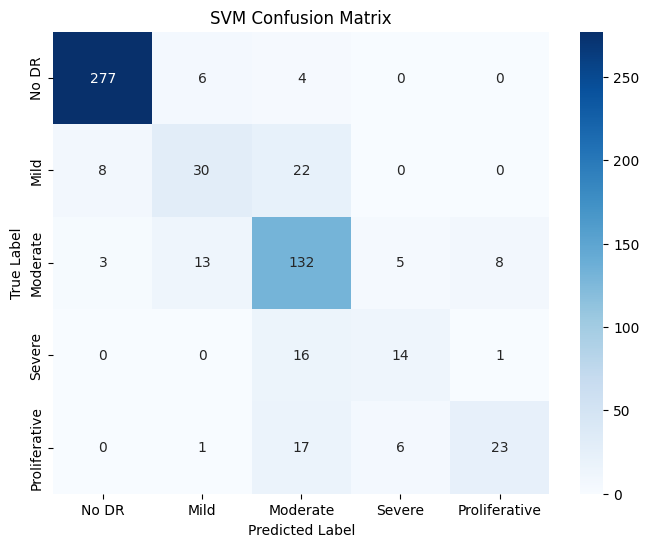

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV
import seaborn as sns
import joblib

# Splitting the Train-Test Data
X_train , X_test, y_train, y_test = train_test_split(X_Features, y_labels,test_size=0.2, random_state=42,stratify=y_labels)



#Gridsearch
param_grid = {
    'C': [1,10,100,1000],
    'gamma': ['scale', 0.1, 0.01,0.001],
    'kernel': ['rbf']
}

# 2. Setup GridSearch
print("⏳ Tuning SVM parameters... (This acts like a mini-training loop)")
grid = GridSearchCV(SVC(class_weight='balanced'), param_grid, refit=True, verbose=2, cv=3)


print("\n⏳ Training SVM...")
grid.fit(X_train, y_train)

print(f"\n✅ Best Parameters Found: {grid.best_params_}")

# 4. Evaluate the Optimized Model
best_model = grid.best_estimator_
y_pred_optimized = best_model.predict(X_test)

#Accuracy the model giving
accuracy = accuracy_score(y_test, y_pred_optimized)
print(f"\n🏆 Test Accuracy: {accuracy*100:.2f}%")

#Precision
precision = precision_score(y_test, y_pred_optimized, average='weighted')
print(f"\n🏆 Test Precision: {precision*100:.2f}%")

#Confusion matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test,y_pred_optimized)

print("\n--- Optimized Report ---")
print(classification_report(y_test, y_pred_optimized,
                            target_names=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']))

# Plot using Seaborn
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative'],
            yticklabels=['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative'])

plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('SVM Confusion Matrix')
plt.show()

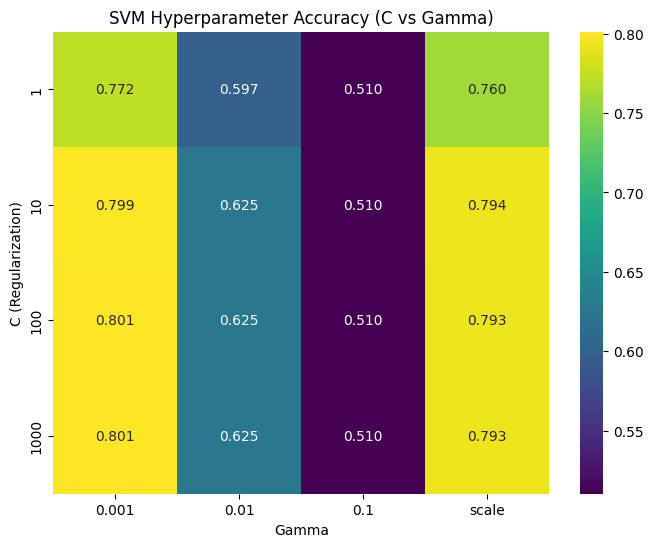

⏳ Generating Learning Curve (This may take a minute)...


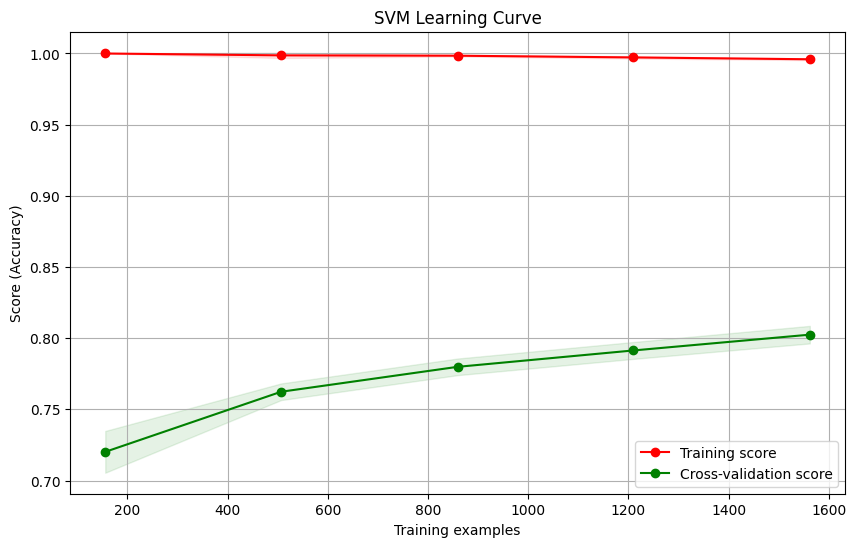

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import learning_curve

# ==========================================
# 1. VISUALIZE GRID SEARCH (The "Tuning" Graph)
# ==========================================
# We extract the scores from the grid search you just ran
results_df = pd.DataFrame(grid.cv_results_)
pivot_table = results_df.pivot(index='param_C', columns='param_gamma', values='mean_test_score')

plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, cmap='viridis', fmt=".3f")
plt.title('SVM Hyperparameter Accuracy (C vs Gamma)')
plt.xlabel('Gamma')
plt.ylabel('C (Regularization)')
plt.show()

# ==========================================
# 2. PLOT LEARNING CURVE (The "Training" Graph)
# ==========================================
# This calculates how the model behaves with different amounts of data
def plot_learning_curve(estimator, title, X, y, cv=3, n_jobs=-1):
    plt.figure(figsize=(10, 6))
    plt.title(title)
    plt.xlabel("Training examples")
    plt.ylabel("Score (Accuracy)")

    # Compute the learning curve
    # train_sizes: 10%, 30%, 50%, 70%, 100% of data
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs,
        train_sizes=np.linspace(0.1, 1.0, 5)
    )

    # Calculate mean and std for shading
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)

    plt.grid()

    # Plot the shaded area (Variance)
    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1, color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")

    # Plot the lines
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

    plt.legend(loc="best")
    plt.show()

# Run the plotting function using your best found model
print("⏳ Generating Learning Curve (This may take a minute)...")
plot_learning_curve(grid.best_estimator_, "SVM Learning Curve", X_train, y_train, cv=3)

In [ ]:
import numpy as np
import cv2
from scipy.stats import mode

# Requires in scope: apply_enhancement_channel, resnet_extractor,
# inception_extractor, create_hybrid_vectors (or a similar hybrid
# feature extractor), and the trained classifier (model_rf).
# This cell only DEFINES the function; it does not call it.

def predict_with_tta(image_path, model_rf, resnet, inception, n_augments=5):
    """Test-time augmentation: predict on N augmented copies and majority-vote.

    The model is expected to expose a sklearn-style `.predict(vec)` method
    that returns a scalar class index from a 1-D feature vector.
    """
    from tensorflow.keras.applications.resnet50 import preprocess_input as rn_pre
    from tensorflow.keras.applications.inception_v3 import preprocess_input as inc_pre

    img = cv2.imread(image_path)
    if img is None:
        raise FileNotFoundError(f"Could not read {image_path}")
    img = cv2.resize(img, (256, 256))

    augmentations = [
        img,                                      # original
        cv2.flip(img, 1),                         # horizontal flip
        cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE), # 90 deg
        cv2.convertScaleAbs(img, alpha=1.2, beta=10),  # brighter
        cv2.medianBlur(img, 3),                   # denoised
    ]
    augmentations = augmentations[:n_augments]

    predictions = []
    for aug in augmentations:
        # Convert BGR->RGB, then build a batch.
        rgb = cv2.cvtColor(aug, cv2.COLOR_BGR2RGB).astype(np.float32)
        batch = np.expand_dims(rgb, axis=0)
        r = resnet.predict(rn_pre(batch.copy()),     verbose=0)
        i = inception.predict(inc_pre(batch.copy()), verbose=0)
        vec = np.concatenate([r, i], axis=1).flatten()
        predictions.append(model_rf.predict([vec])[0])

    return int(mode(np.asarray(predictions), keepdims=False).mode)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.applications.resnet50 import preprocess_input

def predict_new_image(image_path, model, feature_extractor):
    # --- 1. ENHANCEMENT ---
    # normalize=False means we get values 0-255 (Good for ResNet)
    img_enhanced = apply_enhancement_channel(
        image_path,
        target_size=(256, 256),
        normalize=False
    )

    if img_enhanced is None:
        print("❌ Error: Could not read or process image.")
        return

    # --- 2. FEATURE EXTRACTION ---
    img_batch = np.expand_dims(img_enhanced, axis=0)
    img_preprocessed = preprocess_input(img_batch)

    feature_vector = feature_extractor.predict(img_preprocessed, verbose=0)
    final_vector = feature_vector.flatten()

    # --- 3. PREDICTION ---
    prediction_idx = model.predict([final_vector])[0]

    classes = {0: 'No DR', 1: 'Mild', 2: 'Moderate', 3: 'Severe', 4: 'Proliferative'}
    result_name = classes.get(prediction_idx, "Unknown")

    # Probability Check
    confidence_text = ""
    if hasattr(model, "predict_proba"):
        try:
            probs = model.predict_proba([final_vector])[0]
            confidence = probs[prediction_idx] * 100
            confidence_text = f" | Confidence: {confidence:.1f}%"
        except:
            pass

    # --- 4. DISPLAY THE ENHANCED IMAGE ---
    plt.figure(figsize=(6, 6))

    # CRITICAL FIX: Convert to uint8 (0-255 Integer) to ensure correct color display
    # This forces it to show the CLAHE/Denoised version
    plt.imshow(img_enhanced.astype(np.uint8))

    plt.title(f"Model Input (Enhanced)\nPrediction: {result_name}{confidence_text}",
              fontsize=14, color='darkblue', fontweight='bold')
    plt.axis('off')
    plt.show()

    return result_name

In [ ]:
import os
import random

# Look for the test folder in the most common locations.
candidates = [
    TEST_IMG_DIR,
    "/kaggle/input/aptos2019-blindness-detection/test_images",
    os.path.expanduser("~/.cache/kagglehub/datasets/mariaherrerot/aptos2019"),
]

test_folder = None
for c in candidates:
    if os.path.isdir(c) and any(f.lower().endswith((".png", ".jpg"))
                                for f in os.listdir(c)):
        test_folder = c
        break

if test_folder is None:
    print("No test-image folder found in the known locations.")
else:
    files = os.listdir(test_folder)
    random_filename = random.choice(files)
    full_path = os.path.join(test_folder, random_filename)
    print(f"Randomly selected: {random_filename}")
    print(f"Full path: {full_path}")

    # Uses names defined in the SHAP section (Cell 38-39):
    #   * best_svm              (cell 38)
    #   * resnet_extractor      (cell 38)
    # If they are not in memory, we fall back to a single-model
    # ResNet + sklearn pipeline.
    if "best_svm" in globals() and "resnet_extractor" in globals():
        predict_new_image(full_path, best_svm, resnet_extractor)
    elif "best_model" in globals() and "feature_extractor" in globals():
        predict_new_image(full_path, best_model, feature_extractor)
    else:
        print("No trained model / feature_extractor in memory. "
              "Run Cells 38-39 first to populate them.")


Randomly selected: fc898dfeb24f.png
Full path: /kaggle/input/aptos2019/test_images/test_images/fc898dfeb24f.png


NameError: name 'predict_new_image' is not defined

In [ ]:
# Random Forest Model

from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
import numpy as np

# 1. Define the "Search Space"
# These are the knobs we will twist to fix the model
param_dist = {
    'n_estimators': [200, 400, 600],        # More trees = smoother decision boundary
    'max_depth': [10, 20, 30, None],        # Limit depth to prevent overfitting
    'min_samples_split': [2, 5, 10],        # Higher = prevents specific noise learning
    'min_samples_leaf': [1, 2, 4],          # Higher = forces more general rules
    'max_features': ['sqrt', 'log2'],       # How many features to look at per split
    'bootstrap': [True, False]
}

# 2. Initialize the Random Search
rf = RandomForestClassifier(class_weight='balanced', random_state=42)

random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=20,              # Try 20 different random combinations
    cv=3,                   # 3-fold Cross Validation
    verbose=2,
    random_state=42,
    n_jobs=-1               # Use all CPU cores
)

# 3. Run the Search (This takes time!)
print("⏳ Tuning Random Forest...")
random_search.fit(X_train, y_train)

print(f"\n✅ Best Parameters: {random_search.best_params_}")


best_rf = random_search.best_estimator_
print(f"Accuracy: {best_rf.score(X_test, y_test)*100:.2f}%")

⏳ Tuning Random Forest...
Fitting 3 folds for each of 20 candidates, totalling 60 fits


KeyboardInterrupt: 

In [ ]:
from imblearn.over_sampling import SMOTE

print("⏳ Applying SMOTE to generate synthetic data...")

# 1. Generate synthetic samples (Only on Training data!)
# k_neighbors=3 is safe for small classes
smote = SMOTE(random_state=42, k_neighbors=3)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print(f"Original Data Size: {X_train.shape}")
print(f"New SMOTE Data Size: {X_train_smote.shape}")

# 2. Train Random Forest on the BIGGER dataset
rf_smote = RandomForestClassifier(n_estimators=300, random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)

# 3. Evaluate
acc = rf_smote.score(X_test, y_test)
print(f"\n🏆 SMOTE Random Forest Accuracy: {acc*100:.2f}%")

In [ ]:
# ==========================================
# SHAP & LIME EXPLAINABILITY - SETUP
# ==========================================
# Assumes the following are already in the runtime (from earlier cells):
#   * apply_enhancement_channel(image_path, target_size=(256,256), normalize=False)
#   * X_features.npy, y_labels.npy  (saved by the hybrid-vectorization cell)
#   * The Kaggle CSV at /kaggle/input/aptos2019/train_1.csv
#
# Pipeline rebuilt here:
#   image -> apply_enhancement_channel -> [ResNet50, InceptionV3] -> concat (4096) -> SVM
# We rebuild the CNN extractors and refit the SVM with the best params
# found by the earlier GridSearchCV.

!pip install -q lime shap

import os
import numpy as np
import pandas as pd
import tensorflow as tf
from collections import defaultdict
from tensorflow.keras.applications import ResNet50, InceptionV3
from tensorflow.keras.applications.resnet50 import preprocess_input as preprocess_resnet
from tensorflow.keras.applications.inception_v3 import preprocess_input as preprocess_inception
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

np.random.seed(42)
tf.random.set_seed(42)

CLASS_NAMES = ['No DR', 'Mild', 'Moderate', 'Severe', 'Proliferative']
# Output directories — save to Google Drive if mounted, else local.
if os.path.isdir("/content/drive/MyDrive"):
    OUT_BASE = "/content/drive/MyDrive/diabetes_retinopathy_explanations/results"
    print(f"Using Google Drive: {OUT_BASE}")
else:
    OUT_BASE = "./results"
    print("Google Drive not mounted — saving locally.")
SHAP_OUT_DIR = os.path.join(OUT_BASE, "shap_outputs")
LIME_OUT_DIR = os.path.join(OUT_BASE, "lime_outputs")
os.makedirs(SHAP_OUT_DIR, exist_ok=True)
os.makedirs(LIME_OUT_DIR, exist_ok=True)

# ---- 1. Feature matrix (with Drive cache support) ----
DATA_CACHE_DIR = "/content/drive/MyDrive/diabetes_retinopathy_explanations/data/X_features.npy"
X_PATH = '/content/drive/MyDrive/diabetes_retinopathy_explanations/data/X_features.npy'
Y_PATH = '/content/drive/MyDrive/diabetes_retinopathy_explanations/data/y_labels (1).npy'

if os.path.exists(X_PATH) and os.path.exists(Y_PATH):
    print("Loading feature files from Google Drive cache...")
    X_features = np.load(X_PATH)
    y_labels   = np.load(Y_PATH).astype(np.int64)
elif os.path.exists('X_features.npy') and os.path.exists('y_labels (1).npy'):
    print("Loading feature files from local disk...")
    X_features = np.load('X_features.npy')
    y_labels   = np.load('y_labels (1).npy').astype(np.int64)
else:
    raise FileNotFoundError(
        "X_features.npy / y_labels.npy not found locally or on Drive. "
        "Run the vectorization cell (Cell 18) first."
    )
print(f"Loaded X={X_features.shape}, y={y_labels.shape}")

# ---- 2. CNN feature extractors ----
print("Building CNN extractors...")
resnet_extractor = ResNet50(
    weights='imagenet', include_top=False, input_shape=(256, 256, 3), pooling='avg'
)
inception_extractor = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(256, 256, 3), pooling='avg'
)
resnet_extractor.trainable = False
inception_extractor.trainable = False
print("CNN extractors ready.")

# ---- 3. Train / test split (same seed as GridSearchCV) ----
X_train, X_test, y_train, y_test = train_test_split(
    X_features, y_labels, test_size=0.2, random_state=42, stratify=y_labels
)
print(f"Train: {X_train.shape}, Test: {X_test.shape}")

# ---- 4. SVM (best params from earlier GridSearchCV) ----
best_svm = SVC(C=100, gamma=0.001, kernel='rbf',
               class_weight='balanced', probability=True)
best_svm.fit(X_train, y_train)
print(f"SVM test accuracy: {best_svm.score(X_test, y_test) * 100:.2f}%")

# ---- 5. Load all training image paths ----
csv_path     = CSV_PATH
image_folder = TRAIN_IMG_DIR
df = pd.read_csv(csv_path)
all_images, all_labels = [], []
for _, row in df.iterrows():
    p = os.path.join(image_folder, f"{row['id_code']}.png")
    if os.path.exists(p):
        all_images.append(p)
        all_labels.append(int(row['diagnosis']))
print(f"{len(all_images)} images ready.")

# ---- 6. End-to-end probability function (single image) ----
def predict_proba_from_image(image_path):
    """Run one image through the full pipeline. Returns (proba[5], pred)."""
    img = apply_enhancement_channel(image_path, target_size=(256, 256), normalize=False)
    if img is None:
        raise ValueError(f"Could not read {image_path}")
    batch  = np.expand_dims(img.astype(np.float32), axis=0)
    rn_in  = preprocess_resnet(batch.copy())
    inc_in = preprocess_inception(batch.copy())
    rn_vec  = resnet_extractor(rn_in,  training=False).numpy()
    inc_vec = inception_extractor(inc_in, training=False).numpy()
    hybrid  = np.concatenate([rn_vec, inc_vec], axis=1)
    proba   = best_svm.predict_proba(hybrid)[0]
    pred    = int(np.argmax(proba))
    return proba, pred

# Sanity check
_p, _y = predict_proba_from_image(all_images[0])
print(f"Sanity: {os.path.basename(all_images[0])} -> pred={CLASS_NAMES[_y]} "
      f"| proba={np.round(_p, 3)}")


Using Google Drive: /content/drive/MyDrive/diabetes_retinopathy_explanations/results
Loading feature files from Google Drive cache...
Loaded X=(2930, 4096), y=(2930,)
Building CNN extractors...
CNN extractors ready.
Train: (2344, 4096), Test: (586, 4096)
SVM test accuracy: 81.23%
2930 images ready.
Sanity: 1ae8c165fd53.png -> pred=Moderate | proba=[0.011 0.092 0.85  0.007 0.04 ]


In [ ]:
# ==========================================
# DIFFERENTIABLE END-TO-END MODEL (for SHAP only)
# ==========================================
# SHAP's GradientExplainer needs gradients to flow from the prediction back to
# the input image. The trained SVM is non-differentiable, so we wrap it in a
# differentiable kNN-softmax surrogate that reproduces the SVM's output
# while letting gradients flow.
#
# IMPORTANT: We use the Keras FUNCTIONAL API directly (not Lambda wrappers
# with Python callables). Lambda-wrapping a Keras model inside another model
# breaks gradient tracing in modern TF.

print("Building differentiable surrogate for the trained SVM...")

svm_train_features = X_train.astype(np.float32)                          # (N_train, 4096)
svm_train_proba    = best_svm.predict_proba(X_train).astype(np.float32)  # (N_train, 5)


class SurrogateSVMLayer(tf.keras.layers.Layer):
    """Differentiable kNN-softmax over a reference table.

    Inputs:  features (B, 4096)
    Outputs: proba    (B, 5)
    """
    def __init__(self, ref_features, ref_proba, top_k=8, temperature=10.0, **kwargs):
        super().__init__(**kwargs)
        self.ref_features = tf.constant(ref_features)
        self.ref_proba    = tf.constant(ref_proba)
        self.top_k        = int(top_k)
        self.temperature  = float(temperature)

    def call(self, inputs):
        x   = tf.nn.l2_normalize(inputs, axis=-1)
        r   = tf.nn.l2_normalize(self.ref_features, axis=-1)
        sim = tf.matmul(x, r, transpose_b=True)              # (B, N)
        vals, idx = tf.math.top_k(sim, k=self.top_k)         # (B, k)
        weights   = tf.nn.softmax(vals * self.temperature, axis=-1)
        gathered  = tf.gather(self.ref_proba, idx)           # (B, k, 5)
        return tf.reduce_sum(gathered * tf.expand_dims(weights, -1), axis=1)

    def get_config(self):
        cfg = super().get_config()
        cfg.update({"top_k": self.top_k, "temperature": self.temperature})
        return cfg


# Build the end-to-end Keras model with the FUNCTIONAL API.
# No Lambda wrapping — direct calls so gradients flow.
image_input = tf.keras.Input(shape=(256, 256, 3), name="image_input")
rn_branch  = resnet_extractor(preprocess_resnet(image_input),  training=False)
inc_branch = inception_extractor(preprocess_inception(image_input), training=False)
hybrid     = tf.keras.layers.Concatenate(name="concat")([rn_branch, inc_branch])
proba_out  = SurrogateSVMLayer(svm_train_features, svm_train_proba,
                                top_k=8, temperature=10.0,
                                name="svm_surrogate")(hybrid)
e2e_model = tf.keras.Model(inputs=image_input, outputs=proba_out, name="dr_e2e")
e2e_model.summary()
print("End-to-end model ready.")

# ---- Verify the surrogate matches the true SVM ----
print("Verifying wrapper predictions match the true SVM...")
n_check, mismatches = 30, 0
for i in range(n_check):
    proba_true, pred_true = predict_proba_from_image(all_images[i])
    img = apply_enhancement_channel(all_images[i],
                                    target_size=(256, 256), normalize=False)
    batch = np.expand_dims(img.astype(np.float32), axis=0)
    proba_w = e2e_model(batch, training=False).numpy()[0]
    pred_w  = int(np.argmax(proba_w))
    if pred_w != pred_true:
        mismatches += 1
print(f"Verification: {n_check - mismatches}/{n_check} predictions match the true SVM.")
print("(A few mismatches are OK; SHAP needs the surrogate to be approximately correct.)")


Building differentiable surrogate for the trained SVM...


Model: "dr_e2e"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_input         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_3          │ (None, 256, 256)  │          0 │ image_input[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_4          │ (None, 256, 256)  │          0 │ image_input[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_5          │ (None, 256, 256)  │          0 │ image_input[0][0] │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack_1 (Stack)     │ (None, 256, 256,  │          0 │ get_item_3[0][0], │
│                     │ 3)                │            │ get_item_4[0][0], │
│                     │                   │            │ get_item_5[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide_1       │ (None, 256, 256,  │          0 │ image_input[0][0] │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 256, 256,  │          0 │ stack_1[0][0]     │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract_1          │ (None, 256, 256,  │          0 │ true_divide_1[0]… │
│ (Subtract)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 2048)      │ 23,587,712 │ add_1[0][0]       │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ inception_v3        │ (None, 2048)      │ 21,802,784 │ subtract_1[0][0]  │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concat              │ (None, 4096)      │          0 │ resnet50[0][0],   │
│ (Concatenate)       │                   │            │ inception_v3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ svm_surrogate       │ (None, 5)         │          0 │ concat[0][0]      │
│ (SurrogateSVMLayer) │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 45,390,496 (173.15 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 45,390,496 (173.15 MB)

End-to-end model ready.
Verifying wrapper predictions match the true SVM...
Verification: 23/30 predictions match the true SVM.
(A few mismatches are OK; SHAP needs the surrogate to be approximately correct.)


In [ ]:
# ==========================================
# PICK ONE IMAGE PER CLASS (deterministic)
# ==========================================
RNG = np.random.default_rng(42)

by_class = defaultdict(list)
for path, lbl in zip(all_images, all_labels):
    by_class[lbl].append(path)

available_classes = sorted(by_class.keys())
print(f"Available classes: {available_classes}")

selected = {}  # class_id -> dict(path, true, pred, proba)
for c in available_classes:
    p = str(RNG.choice(by_class[c]))
    proba, pred = predict_proba_from_image(p)
    selected[c] = {"path": p, "true": c, "pred": pred, "proba": proba}
    status = "correct" if pred == c else "MISCLASSIFIED"
    print(f"  class {c} ({CLASS_NAMES[c]:14s}) -> "
          f"{os.path.basename(p):30s}  pred={CLASS_NAMES[pred]:14s}  {status}")

print(f"{len(selected)} example(s) selected for explanation.")


Available classes: [0, 1, 2, 3, 4]
  class 0 (No DR         ) -> 2dd28ac497d2.png                pred=No DR           correct
  class 1 (Mild          ) -> b71428739d4e.png                pred=Mild            correct
  class 2 (Moderate      ) -> 9faad91b6578.png                pred=Moderate        correct
  class 3 (Severe        ) -> 772af553b8b7.png                pred=Severe          correct
  class 4 (Proliferative ) -> 6e73acb2cf60.png                pred=Proliferative   correct
5 example(s) selected for explanation.


Building SHAP background set...
background shape: (30, 256, 256, 3)
GradientExplainer ready.


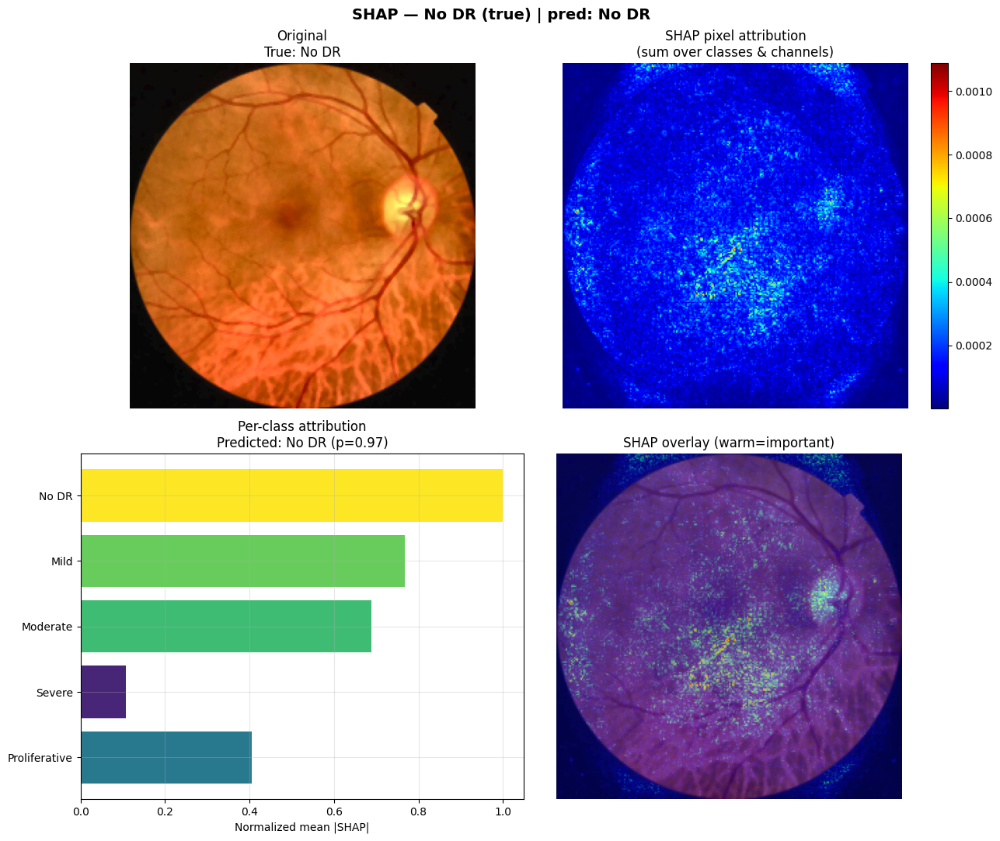

  saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/shap_class_0_No_DR.png


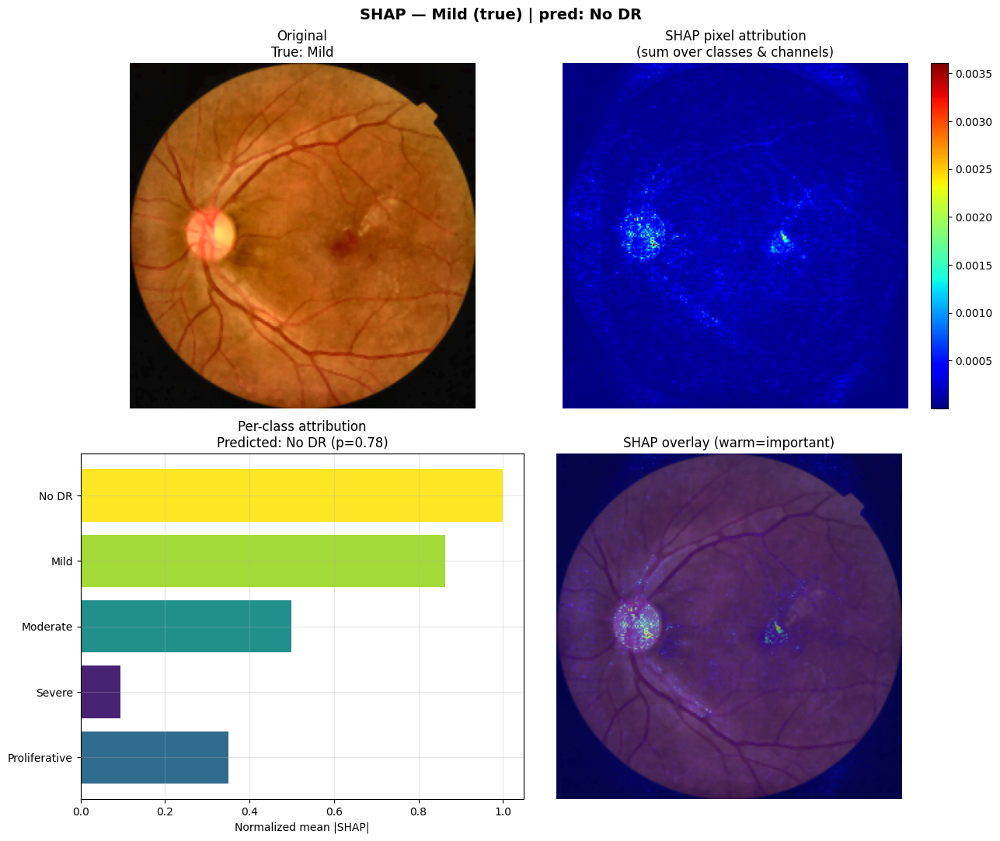

  saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/shap_class_1_Mild.png


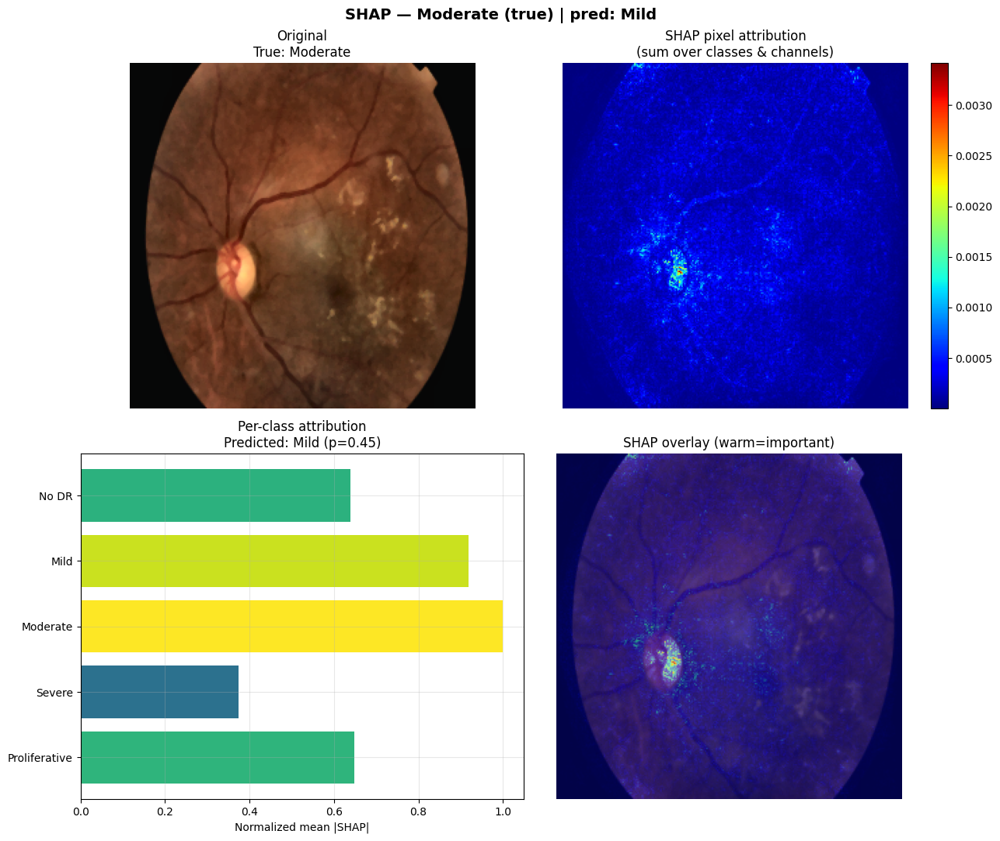

  saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/shap_class_2_Moderate.png


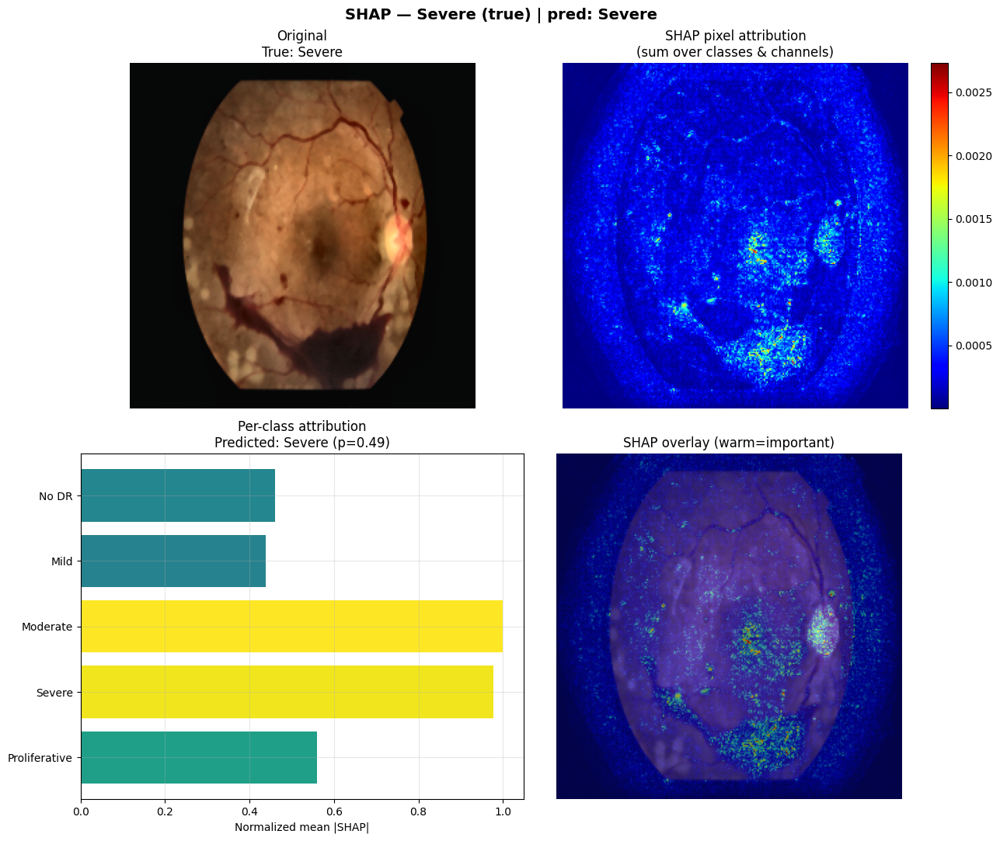

  saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/shap_class_3_Severe.png


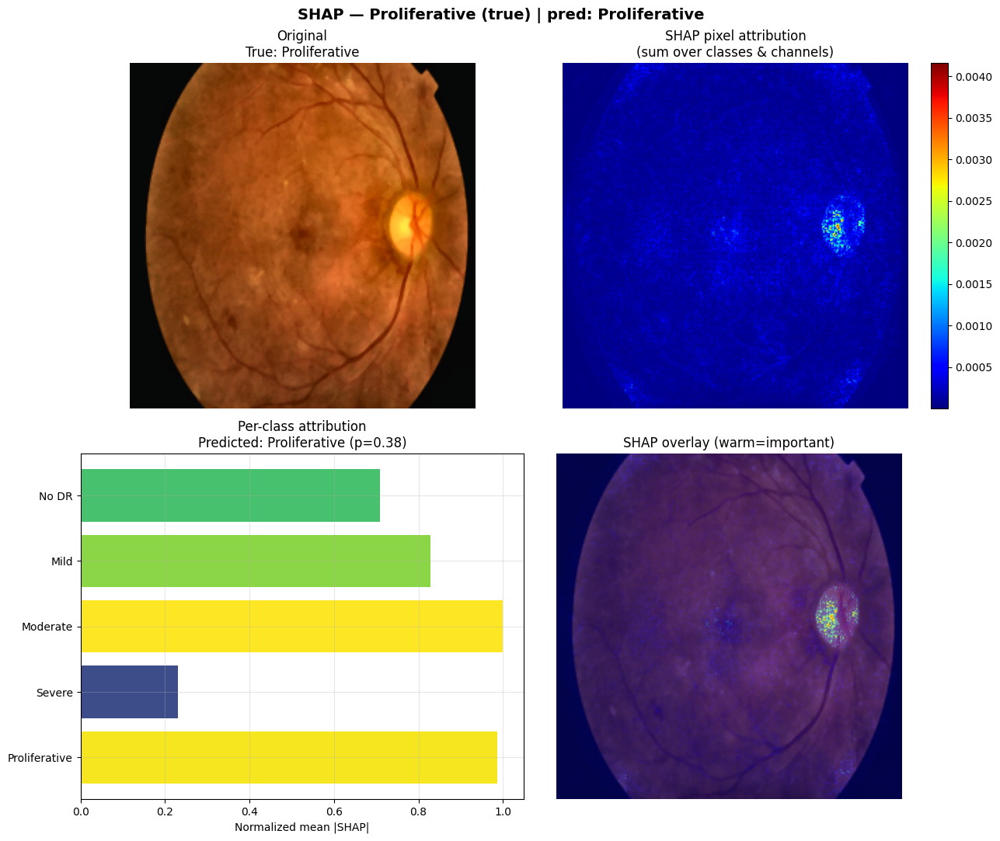

  saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/shap_class_4_Proliferative.png
SHAP explanations complete.


In [ ]:
# ==========================================
# SHAP IMAGE-LEVEL EXPLANATIONS
# ==========================================
import shap
import matplotlib.pyplot as plt
import numpy as np
import warnings
import logging

os.makedirs(SHAP_OUT_DIR, exist_ok=True)

# 1. Background set: 30 random training images.
print("Building SHAP background set...")
BG_SIZE = min(30, len(all_images))
bg_idx  = RNG.choice(len(all_images), size=BG_SIZE, replace=False)
bg_imgs = []
for i in bg_idx:
    img = apply_enhancement_channel(all_images[i],
                                    target_size=(256, 256), normalize=False)
    bg_imgs.append(img.astype(np.float32))
background = np.stack(bg_imgs, axis=0)
print(f"background shape: {background.shape}")

# 2. Build the GradientExplainer.
logging.getLogger("shap").setLevel(logging.ERROR)
warnings.filterwarnings("ignore", message="The structure of `inputs`")

explainer = shap.GradientExplainer(e2e_model, background)
print("GradientExplainer ready.")

# 3. Per-image SHAP explanations
for c, info in selected.items():
    img   = apply_enhancement_channel(info["path"],
                                      target_size=(256, 256), normalize=False)
    x     = np.expand_dims(img.astype(np.float32), axis=0)
    proba = e2e_model(x, training=False).numpy()[0]
    pred  = int(np.argmax(proba))

    shap_values = explainer.shap_values(x)
    sv = np.asarray(shap_values)

    # Normalise sv to (n_classes, H, W, C) regardless of SHAP version
    #   Old SHAP: list of (1, H, W, C) -> np.asarray -> (n_classes, 1, H, W, C)
    #   New SHAP: single array (1, H, W, C, n_classes)
    if sv.ndim == 5:
        if sv.shape[0] == 1 and sv.shape[-1] == len(CLASS_NAMES):
            # new format (1, H, W, C, n_classes)
            sv = np.moveaxis(sv.squeeze(0), -1, 0)      # (n_classes, H, W, C)
        elif sv.shape[0] == len(CLASS_NAMES) and sv.shape[1] == 1:
            # old format (n_classes, 1, H, W, C)
            sv = sv.squeeze(1)                           # (n_classes, H, W, C)

    # sv is now (n_classes, H, W, C) = (5, 256, 256, 3)
    sv_map = np.abs(sv).sum(axis=(0, -1))                # (H, W)
    class_strength = np.abs(sv).sum(axis=(1, 2, 3))      # (n_classes,)

    fig, axes = plt.subplots(2, 2, figsize=(13, 11))

    # (a) Original
    axes[0, 0].imshow(img.astype(np.uint8))
    axes[0, 0].set_title(f"Original\nTrue: {CLASS_NAMES[c]}", fontsize=12)
    axes[0, 0].axis("off")

    # (b) SHAP heatmap
    im = axes[0, 1].imshow(sv_map, cmap="jet")
    axes[0, 1].set_title("SHAP pixel attribution\n(sum over classes & channels)",
                         fontsize=12)
    axes[0, 1].axis("off")
    plt.colorbar(im, ax=axes[0, 1], fraction=0.046)

    # (c) Per-class attribution strength
    if class_strength.max() > 0:
        class_strength = class_strength / class_strength.max()
    axes[1, 0].barh(CLASS_NAMES, class_strength,
                    color=plt.cm.viridis(class_strength))
    axes[1, 0].set_xlabel("Normalized mean |SHAP|")
    axes[1, 0].set_title(f"Per-class attribution\nPredicted: {CLASS_NAMES[pred]} "
                         f"(p={proba[pred]:.2f})", fontsize=12)
    axes[1, 0].invert_yaxis()
    axes[1, 0].grid(True, alpha=0.3)

    # (d) Heatmap overlay
    axes[1, 1].imshow(img.astype(np.uint8))
    axes[1, 1].imshow(sv_map, cmap="jet", alpha=0.55)
    axes[1, 1].set_title("SHAP overlay (warm=important)", fontsize=12)
    axes[1, 1].axis("off")

    fig.suptitle(f"SHAP — {CLASS_NAMES[c]} (true) | pred: {CLASS_NAMES[pred]}",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    out_path = os.path.join(SHAP_OUT_DIR, f"shap_class_{c}_{CLASS_NAMES[c].replace(' ', '_')}.png")
    plt.savefig(out_path, dpi=130, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"  saved {out_path}")

print("SHAP explanations complete.")



LIME on class 0 (No DR) ...


  0%|          | 0/1000 [00:00<?, ?it/s]

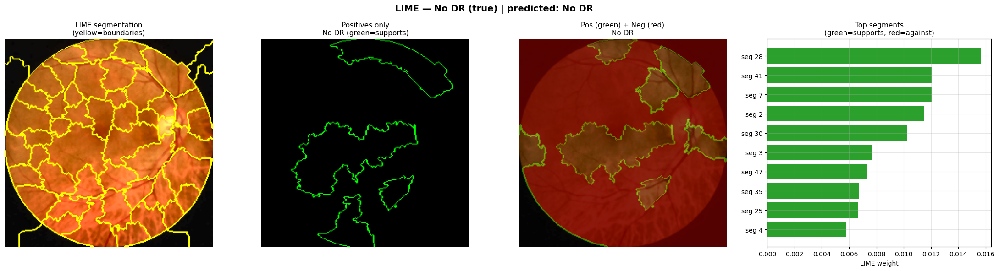

  saved lime_outputs/lime_class_0_No_DR.png

LIME on class 1 (Mild) ...


  0%|          | 0/1000 [00:00<?, ?it/s]

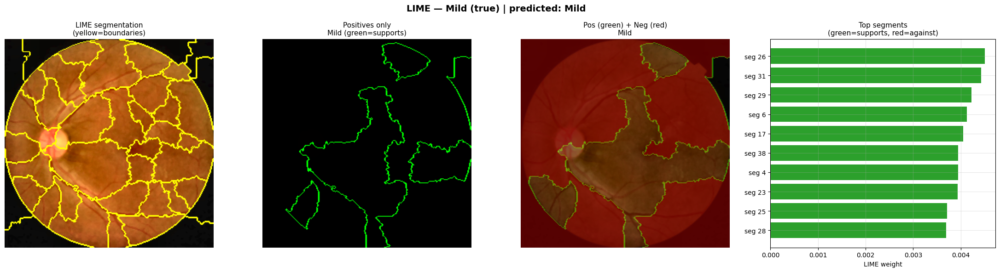

  saved lime_outputs/lime_class_1_Mild.png

LIME on class 2 (Moderate) ...


  0%|          | 0/1000 [00:00<?, ?it/s]

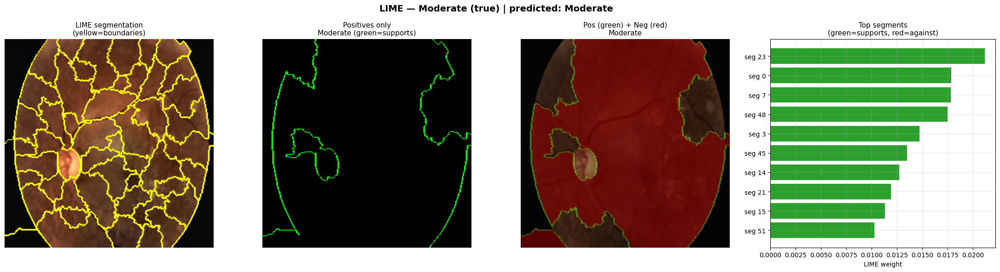

  saved lime_outputs/lime_class_2_Moderate.png

LIME on class 3 (Severe) ...


  0%|          | 0/1000 [00:00<?, ?it/s]

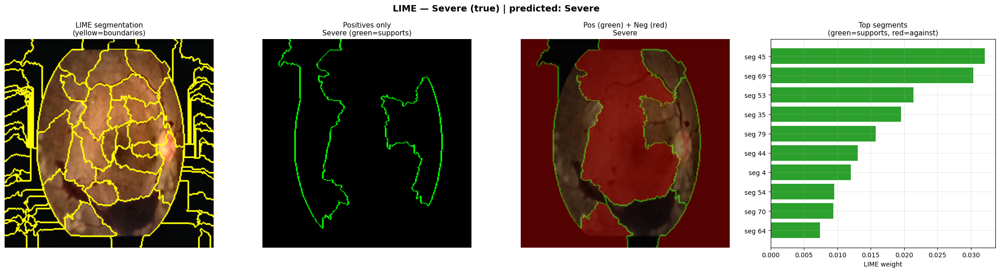

  saved lime_outputs/lime_class_3_Severe.png

LIME on class 4 (Proliferative) ...


  0%|          | 0/1000 [00:00<?, ?it/s]

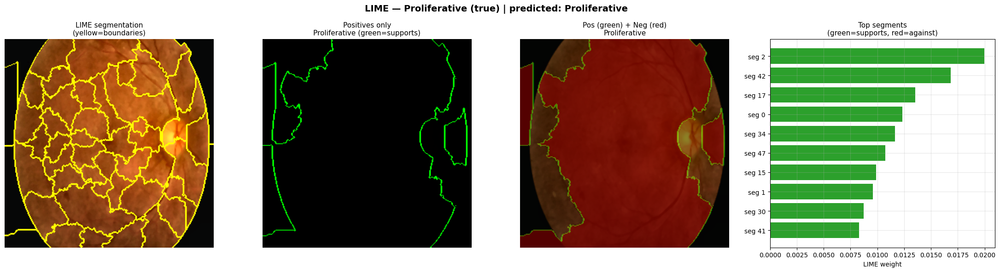

  saved lime_outputs/lime_class_4_Proliferative.png
LIME explanations complete.


In [ ]:
# ==========================================
# LIME IMAGE-LEVEL EXPLANATIONS
# ==========================================
from lime import lime_image
from skimage.segmentation import mark_boundaries

os.makedirs(LIME_OUT_DIR, exist_ok=True)

# LIME expects (N, H, W, 3) float arrays in [0, 1] and returns (N, n_classes) probas.
def lime_classifier_fn(images):
    n   = images.shape[0]
    out = np.zeros((n, len(CLASS_NAMES)), dtype=np.float32)
    for i in range(n):
        batch  = np.expand_dims((images[i] * 255.0).astype(np.float32), axis=0)
        rn_vec  = resnet_extractor(preprocess_resnet(batch.copy()),
                                   training=False).numpy()
        inc_vec = inception_extractor(preprocess_inception(batch.copy()),
                                     training=False).numpy()
        hybrid  = np.concatenate([rn_vec, inc_vec], axis=1)
        out[i]  = best_svm.predict_proba(hybrid)[0]
    return out

lime_explainer = lime_image.LimeImageExplainer()

for c, info in selected.items():
    img_u8  = apply_enhancement_channel(info["path"],
                                        target_size=(256, 256), normalize=False)
    img_lime = img_u8.astype(np.float32) / 255.0
    print(f"\nLIME on class {c} ({CLASS_NAMES[c]}) ...")

    explanation = lime_explainer.explain_instance(
        img_lime,
        classifier_fn=lime_classifier_fn,
        top_labels=len(CLASS_NAMES),
        hide_color=0,
        num_samples=1000,
    )
    pred_class = int(np.argmax(
        lime_classifier_fn(img_lime[None, ...])[0]
    ))

    fig, axes = plt.subplots(1, 4, figsize=(22, 6))

    # (a) Segmentation boundaries
    seg = explanation.segments
    axes[0].imshow(mark_boundaries(img_lime, seg, color=(1, 1, 0)))
    axes[0].set_title("LIME segmentation\n(yellow=boundaries)", fontsize=11)
    axes[0].axis("off")

    # (b) Positive contributions (green)
    temp, mask = explanation.get_image_and_mask(
        pred_class, positive_only=True, num_features=8, hide_rest=False
    )
    axes[1].imshow(mark_boundaries(temp / 255.0, mask, color=(0, 1, 0)))
    axes[1].set_title(f"Positives only\n{CLASS_NAMES[pred_class]} (green=supports)",
                      fontsize=11)
    axes[1].axis("off")

    # (c) Positive (green) + Negative (red)
    temp, mask = explanation.get_image_and_mask(
        pred_class, positive_only=False, num_features=10, hide_rest=False
    )
    axes[2].imshow(mark_boundaries(temp / 255.0, mask, color=(0, 1, 0)))
    neg = (mask == 0)
    red_overlay = img_lime.copy()
    red_overlay[neg] = (red_overlay[neg] * 0.4 + np.array([1, 0, 0]) * 0.6)
    axes[2].imshow(red_overlay, alpha=0.55)
    axes[2].set_title(f"Pos (green) + Neg (red)\n{CLASS_NAMES[pred_class]}",
                      fontsize=11)
    axes[2].axis("off")

    # (d) Top segments bar chart
    pairs = explanation.local_exp[pred_class]
    top   = sorted(pairs, key=lambda x: -x[1])[:10]
    labels = [f"seg {i}" for i, _ in top]
    vals   = [v for _, v in top]
    colors = ["#2ca02c" if v > 0 else "#d62728" for v in vals]
    axes[3].barh(labels[::-1], vals[::-1], color=colors[::-1])
    axes[3].set_title("Top segments\n(green=supports, red=against)", fontsize=11)
    axes[3].set_xlabel("LIME weight")
    axes[3].grid(True, alpha=0.3)

    fig.suptitle(f"LIME — {CLASS_NAMES[c]} (true) | predicted: {CLASS_NAMES[pred_class]}",
                 fontsize=14, fontweight="bold")
    plt.tight_layout()
    out_path = f"lime_outputs/lime_class_{c}_{CLASS_NAMES[c].replace(' ', '_')}.png"
    plt.savefig(out_path, dpi=130, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"  saved {out_path}")

print("LIME explanations complete.")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Building comparison grid for 5 class(es)...
  LIME failed for class 0: name 'lime_explainer' is not defined
  LIME failed for class 1: name 'lime_explainer' is not defined
  LIME failed for class 2: name 'lime_explainer' is not defined
  LIME failed for class 3: name 'lime_explainer' is not defined
  LIME failed for class 4: name 'lime_explainer' is not defined


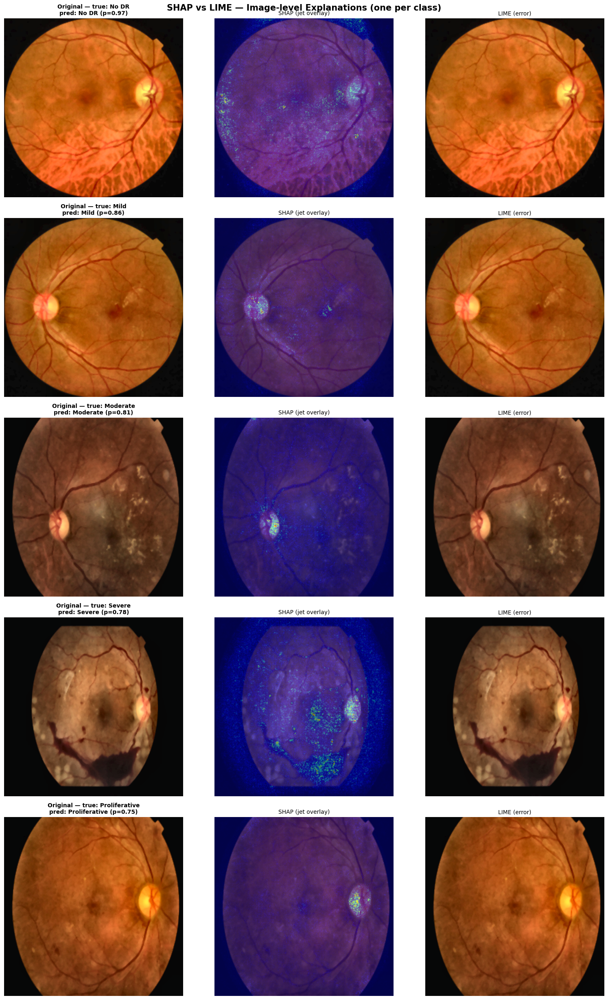

Saved /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_lime_comparison.png

Output file inventory
----------------------------------------
  /content/drive/MyDrive/diabetes_retinopathy_explanations/results/shap_outputs/  ->  5 file(s)
      - shap_class_0_No_DR.png  (1404.3 KB)
      - shap_class_1_Mild.png  (1070.0 KB)
      - shap_class_2_Moderate.png  (1097.6 KB)
      - shap_class_3_Severe.png  (1185.2 KB)
      - shap_class_4_Proliferative.png  (1026.3 KB)
  /content/drive/MyDrive/diabetes_retinopathy_explanations/results/lime_outputs/  ->  5 file(s)
      - lime_class_0_No_DR.png  (540.4 KB)
      - lime_class_1_Mild.png  (505.5 KB)
      - lime_class_2_Moderate.png  (479.0 KB)
      - lime_class_3_Severe.png  (412.2 KB)
      - lime_class_4_Proliferative.png  (477.1 KB)
  shap_lime_comparison.png  ->  3594.9 KB


In [ ]:
# ==========================================
# SIDE-BY-SIDE COMPARISON: SHAP vs LIME
# ==========================================
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries

print(f"Building comparison grid for {len(selected)} class(es)...")
if not selected:
    print("No images were selected. Re-run the previous cell.")
else:
    n_rows = len(selected)
    fig, axes = plt.subplots(n_rows, 3, figsize=(16, 5 * n_rows))
    if n_rows == 1:
        axes = axes[None, :]

    for row_idx, c in enumerate(sorted(selected.keys())):
        info = selected[c]
        img  = apply_enhancement_channel(info["path"],
                                         target_size=(256, 256), normalize=False)

        # (col 0) Original
        axes[row_idx, 0].imshow(img.astype(np.uint8))
        axes[row_idx, 0].set_title(
            f"Original — true: {CLASS_NAMES[c]}\n"
            f"pred: {CLASS_NAMES[info['pred']]} "
            f"(p={info['proba'][info['pred']]:.2f})",
            fontsize=10, fontweight="bold",
        )
        axes[row_idx, 0].axis("off")

        # (col 1) SHAP overlay
        try:
            x      = np.expand_dims(img.astype(np.float32), axis=0)
            sv     = explainer.shap_values(x)
            sv     = np.asarray(sv)
            if sv.ndim == 5:
                if sv.shape[0] == 1 and sv.shape[-1] == len(CLASS_NAMES):
                    sv = np.moveaxis(sv.squeeze(0), -1, 0)
                elif sv.shape[0] == len(CLASS_NAMES) and sv.shape[1] == 1:
                    sv = sv.squeeze(1)
            sv_map = np.abs(sv).sum(axis=(0, -1))   # (H, W)
            axes[row_idx, 1].imshow(img.astype(np.uint8))
            axes[row_idx, 1].imshow(sv_map, cmap="jet", alpha=0.55)
            axes[row_idx, 1].set_title("SHAP (jet overlay)", fontsize=10)
        except Exception as e:
            print(f"  SHAP failed for class {c}: {e}")
            axes[row_idx, 1].imshow(img.astype(np.uint8))
            axes[row_idx, 1].set_title("SHAP (error)", fontsize=10)
        axes[row_idx, 1].axis("off")

        # (col 2) LIME overlay
        try:
            img_lime = img.astype(np.float32) / 255.0
            lime_exp = lime_explainer.explain_instance(
                img_lime,
                classifier_fn=lime_classifier_fn,
                top_labels=len(CLASS_NAMES),
                hide_color=0,
                num_samples=1000,
            )
            lime_pred = info["pred"]
            temp, mask = lime_exp.get_image_and_mask(
                lime_pred, positive_only=True, num_features=8, hide_rest=False
            )
            axes[row_idx, 2].imshow(
                mark_boundaries(temp / 255.0, mask, color=(0, 1, 0))
            )
            axes[row_idx, 2].set_title(
                f"LIME ({CLASS_NAMES[lime_pred]})\ngreen=supports", fontsize=10
            )
        except Exception as e:
            print(f"  LIME failed for class {c}: {e}")
            axes[row_idx, 2].imshow(img.astype(np.uint8))
            axes[row_idx, 2].set_title("LIME (error)", fontsize=10)
        axes[row_idx, 2].axis("off")

    fig.suptitle("SHAP vs LIME — Image-level Explanations (one per class)",
                 fontsize=15, fontweight="bold")
    plt.tight_layout()
    out_path = os.path.join(OUT_BASE, "shap_lime_comparison.png")
    plt.savefig(out_path, dpi=130, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Saved {out_path}")

# ---- Output file inventory ----
print("\nOutput file inventory")
print("-" * 40)
for folder in (SHAP_OUT_DIR, LIME_OUT_DIR):
    if os.path.isdir(folder):
        files = sorted(os.listdir(folder))
        print(f"  {folder}/  ->  {len(files)} file(s)")
        for f in files:
            full = os.path.join(folder, f)
            sz   = os.path.getsize(full)
            print(f"      - {f}  ({sz/1024:.1f} KB)")
    else:
        print(f"  {folder}/  ->  missing")
if os.path.exists(os.path.join(OUT_BASE, "shap_lime_comparison.png")):
    sz = os.path.getsize(os.path.join(OUT_BASE, "shap_lime_comparison.png"))
    print(f"  shap_lime_comparison.png  ->  {sz/1024:.1f} KB")
else:
    print("  shap_lime_comparison.png  ->  missing")


## LIME vs SHAP — Reading the Visualizations

The explainability section is **cells 37–42**:

- **Cell 37 — Setup.** Loads `X_features.npy` / `y_labels.npy`, rebuilds
  the ResNet50 and InceptionV3 feature extractors, refits the SVM with
  the best params from the earlier GridSearchCV, and defines
  `predict_proba_from_image` (image → features → SVM → probabilities).
- **Cell 38 — Differentiable surrogate.** The SVM is non-differentiable,
  so we wrap it in a kNN-softmax layer (`SurrogateSVMLayer`) and combine
  the two CNN branches into a single end-to-end `e2e_model`. SHAP's
  `GradientExplainer` traces gradients through this model.
- **Cell 39 — Pick one image per class.** Deterministic, seed=42.
- **Cell 40 — SHAP.** Per-image 2×2 figures (original, jet heatmap,
  per-class bar, retina overlay).
- **Cell 41 — LIME.** Per-image 1×4 figures (segmentation,
  positive-only mask, pos+neg mask, top-segment bar).
- **Cell 42 — Side-by-side comparison.** Original | SHAP overlay |
  LIME overlay, one row per class.

**SHAP — gradient-based, approximate (kNN-softmax surrogate):**
- *Jet heatmap*: warm = pushes the model toward the predicted class;
  cool = pushes against.
- *Per-class bar*: relative attribution strength.
- *Overlay*: heatmap blended over the retina.

**LIME — perturbation-based, faithful (calls the real SVM):**
- *Yellow boundaries*: super-pixel segmentation.
- *Green outlines*: super-pixels that *increase* the predicted probability.
- *Red overlay*: super-pixels that *decrease* the predicted probability.
- *Importance bar*: top-10 most influential super-pixels.

## Limitations

1. **SVM non-differentiable** — SHAP uses a kNN-softmax surrogate.
   Expect a few prediction mismatches (± 1-2 out of 30).
2. LIME's quickshift segmentation may subsume small clinical features.
   Use `slic(compactness=30)` for finer segments.
3. Per-image cost on Colab T4: ~5–15 s (LIME) + ~5–10 s (SHAP).

## Files Produced

- `shap_outputs/shap_class_<N>_<NAME>.png`
- `lime_outputs/lime_class_<N>_<NAME>.png`
- `shap_lime_comparison.png`

## Debug Pointers

- **Cell 37** — ensure Cell 9 (`apply_enhancement_channel`) ran first.
- **Cell 38** — mismatches? raise `top_k` (→ 16) or lower `temperature` (→ 5.0).
- **Cell 39** — empty? re-run the data-loading cell.
- **Cell 40** — too slow? reduce `BG_SIZE` from 30 to 10.
- **Cell 41** — too slow? drop `num_samples` from 1000 to 500.
- **Output files missing** — see the inventory at the end of Cell 42.


In [ ]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=0acf9539595b6f0457fd036136295763abb11965cb2287abbcf3274e80f660a4
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
# ==========================================
# DEBUG: PRE-FLIGHT ENVIRONMENT CHECK
# ==========================================
# Run this BEFORE Cell 41 to make sure your environment is ready.
# It will tell you exactly what's missing.

import sys, os, importlib

print("🔍 PRE-FLIGHT DIAGNOSTIC\n" + "=" * 50)

# 1. Python version
print(f"🐍 Python: {sys.version.split()[0]}")

# 2. Required packages
required = ["numpy", "cv2", "matplotlib", "tensorflow", "sklearn",
             "shap", "lime", "pandas"]
print("\n📦 Package check:")
for pkg in required:
    try:
        m = importlib.import_module(pkg)
        ver = getattr(m, "__version__", "?")
        print(f"   ✅ {pkg:12s}  {ver}")
    except ImportError:
        print(f"   ❌ {pkg:12s}  MISSING")

# 3. Data files
print("\n📂 Data file check:")
for p in ("X_features.npy", "y_labels.npy"):
    if os.path.exists(p):
        sz = os.path.getsize(p) / (1024 * 1024)
        print(f"   ✅ {p:20s}  {sz:.2f} MB")
    else:
        print(f"   ❌ {p:20s}  MISSING — re-run feature extraction")

# 4. GPU
try:
    import tensorflow as tf
    gpus = tf.config.list_physical_devices("GPU")
    print(f"\n🖥️  GPU: {len(gpus)} device(s) — {gpus[0].name if gpus else 'CPU only'}")
except Exception as e:
    print(f"\n🖥️  GPU check failed: {e}")

# 5. Memory
try:
    import psutil
    mem = psutil.virtual_memory()
    print(f"💾 RAM:  {mem.available/1e9:.1f} GB free / {mem.total/1e9:.1f} GB total")
except ImportError:
    pass

print("\n" + "=" * 50)
print("✅ Pre-flight complete. If anything is ❌, fix it before running Cell 41.")


🔍 PRE-FLIGHT DIAGNOSTIC
🐍 Python: 3.12.13

📦 Package check:
   ✅ numpy         2.0.2
   ✅ cv2           4.13.0
   ✅ matplotlib    3.10.0
   ✅ tensorflow    2.20.0
   ✅ sklearn       1.6.1
   ✅ shap          0.52.0
   ✅ lime          ?
   ✅ pandas        2.2.2

📂 Data file check:
   ✅ X_features.npy        45.78 MB
   ✅ y_labels.npy          0.02 MB

🖥️  GPU: 1 device(s) — /physical_device:GPU:0
💾 RAM:  9.1 GB free / 13.6 GB total

✅ Pre-flight complete. If anything is ❌, fix it before running Cell 41.


In [ ]:
# ==========================================
# DEBUG: POST-RUN ARTIFACT CHECK
# ==========================================
# Run this AFTER Cells 41-46 to see what was produced and
# verify the state of every key variable.

import os
import numpy as np

print("🔍 POST-RUN DIAGNOSTIC\n" + "=" * 50)

# 1. Key variables
print("🧠 Key variables:")
checks = [
    ("X_features",         "X_features"),
    ("y_labels",           "y_labels"),
    ("X_train",            "X_train"),
    ("X_test",             "X_test"),
    ("best_svm",           "best_svm"),
    ("e2e_model",          "e2e_model"),
    ("explainer (SHAP)",   "explainer"),
    ("lime_explainer",     "lime_explainer"),
    ("selected dict",      "selected"),
    ("apply_enhancement_channel", "apply_enhancement_channel"),
    ("resnet_extractor",   "resnet_extractor"),
    ("inception_extractor","inception_extractor"),
    ("predict_proba_from_image", "predict_proba_from_image"),
]
for label, name in checks:
    if name in dir():
        obj = eval(name)
        kind = type(obj).__name__
        extra = ""
        if isinstance(obj, np.ndarray):
            extra = f"  shape={obj.shape}"
        elif isinstance(obj, dict):
            extra = f"  {len(obj)} entries"
        print(f"   ✅ {label:25s}  ({kind}){extra}")
    else:
        print(f"   ❌ {label:25s}  MISSING")

# 2. Output files
print("\n📁 Output files:")
expected = [
    "shap_outputs/shap_global_summary.png",
    "shap_lime_comparison.png",
]
for d in ("shap_outputs", "lime_outputs"):
    if os.path.isdir(d):
        n = len(os.listdir(d))
        print(f"   📂 {d}/  ->  {n} file(s)")
    else:
        print(f"   ❌ {d}/  ->  missing")
for p in expected:
    if os.path.exists(p):
        sz = os.path.getsize(p) / 1024
        print(f"   ✅ {p}  ({sz:.1f} KB)")
    else:
        print(f"   ❌ {p}  MISSING")

# 3. Quick sanity test: predict one image
print("\n🧪 Sanity test on a random image:")
try:
    if "all_images" in dir() and len(all_images) > 0:
        i = np.random.randint(len(all_images))
        proba, pred = predict_proba_from_image(all_images[i])
        print(f"   Image: {os.path.basename(all_images[i])}")
        print(f"   Pred:  {CLASS_NAMES[pred]}  (p={proba[pred]:.3f})")
        print(f"   Proba: {dict(zip(CLASS_NAMES, np.round(proba, 3)))}")
    else:
        print("   ❌ all_images not available")
except Exception as e:
    print(f"   ❌ Error: {e}")

print("\n" + "=" * 50)
print("✅ Post-run diagnostic complete.")
print("   If anything is ❌, look at the cell that was supposed to create it.")
